# <center>USL-Project Part One

In [1]:
# Importing the libraries

# Basic
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from collections import Counter

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist

# Linear Regression
from sklearn.linear_model import LinearRegression as LR
from sklearn.metrics import mean_absolute_error as mae


## 1.Import and warehouse data: 

### <center>Import all the given datasets and explore shape and size

In [2]:
# Importing the datasets by reading the appropriate CSV files

Data1 = pd.read_csv('Part1 - Car name.csv')
Data2 = pd.read_json('Part1 - Car-Attributes.json')

In [3]:
# Checking the shape of the imported datasets

print('First data set shape:',Data1.shape)
print('Second data set shape:',Data2.shape)

First data set shape: (398, 1)
Second data set shape: (398, 8)


In [4]:
# Checking the size of the imported datasets

print('First data set size:',Data1.size)
print('Second data set size:',Data2.size)

First data set size: 398
Second data set size: 3184


In [5]:
# Checking the dimension of the imported datasets

print('First data set dimesnion:',Data1.ndim)
print('Second data set dimension:',Data2.ndim)

First data set dimesnion: 2
Second data set dimension: 2


In [6]:
# Checking the length of the imported datasets (Number of rows)
# Checking the length of the imported datasets (Number of rows)

print('First data set length:',len(Data1))
print('Second data set length:',len(Data2))

First data set length: 398
Second data set length: 398


In [7]:
# Checking the information of the imported datasets

print(Data1.info())
print('\n***************************************\n')
print(Data2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   car_name  398 non-null    object
dtypes: object(1)
memory usage: 3.2+ KB
None

***************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    object 
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    int64  
dtypes: float64(3), int64(4), object(1)
memory usage: 25.0+ KB
None


- Shape, size, dimension, length and information of the given datasets can be seen above. 

### <center>Merge all datasets onto one and explore final shape and size

In [8]:
# Merging the datasets

data_merged = pd.concat([Data1,Data2],axis=1)

In [9]:
# Range of the dataset

data_merged.index

RangeIndex(start=0, stop=398, step=1)

In [10]:
# Shape of the dataset

data_merged.shape

(398, 9)

In [11]:
# Size of the dataset

data_merged.size

3582

In [12]:
# Length of the dataset
# Number of rows

len(data_merged)

398

In [13]:
# Information about the dataset

data_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


### <center>Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use

In [14]:
# To CSV
data_merged.to_csv('Exported_CSV.csv',index=False,header=True)

# To XLSX
data_merged.to_json('Exported_JSON.json')

# To JSON
data_merged.to_excel('Exported_XLSX.xlsx',index=False,header=True)

In [15]:
# Displaying the exported CSV

pd.read_csv('Exported_CSV.csv').head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [16]:
# Displaying the exported JSON

pd.read_json('Exported_JSON.json').head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [17]:
# Displaying the exported XLSX

pd.read_excel('Exported_XLSX.xlsx').head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


## 2.Data cleansing:

In [18]:
# Let's first create a copy of our main dataset

data = data_merged.copy()

In [19]:
# Observing the dataset 'data_merged'
# First and last 5 rows displayed

data

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1


In [20]:
# Let's observe the values which might give us some more insights

data.describe(include='all')

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
count,398,398.000000,398.000000,398.000000,398.0,398.000000,398.000000,398.000000,398.000000
unique,305,NaN,NaN,NaN,94.0,NaN,NaN,NaN,NaN
top,ford pinto,NaN,NaN,NaN,150.0,NaN,NaN,NaN,NaN
freq,6,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN
mean,NaN,23.514573,5.454774,193.425879,NaN,2970.424623,15.568090,76.010050,1.572864
std,NaN,7.815984,1.701004,104.269838,NaN,846.841774,2.757689,3.697627,0.802055
min,NaN,9.000000,3.000000,68.000000,NaN,1613.000000,8.000000,70.000000,1.000000
25%,NaN,17.500000,4.000000,104.250000,NaN,2223.750000,13.825000,73.000000,1.000000
50%,NaN,23.000000,4.000000,148.500000,NaN,2803.500000,15.500000,76.000000,1.000000
75%,NaN,29.000000,8.000000,262.000000,NaN,3608.000000,17.175000,79.000000,2.000000


In [21]:
# Checking the information on the given dataset

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


### <center>Missing/incorrect value treatment

- As we can see the that 'hp' should be continuous and numeric type but instead is object type so it needs to converted appropriately. 

In [22]:
# Following gives error mentioned below indicating all values in the 'hp' column are not numerics
# data['hp'] = data['hp'].astype('int64')
# ValueError: invalid literal for int() with base 10: '?'

In [23]:
data[data['hp']=='?']

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


- As we can see the missing values shows related high mpg so we can replace the same with a lower quantile value.

In [24]:
# Observing the above error checking how many rows have '?' values

len(data[data['hp']=='?'])

6

In [25]:
# Removing the unwanted/incorrect value by replacing it with null values
# Changing the 'hp' datatype appropraitely

data['hp'] = pd.to_numeric(data['hp'], errors='coerce').astype('float')

In [26]:
# Checking for null values

data.isna().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
dtype: int64

- We can see that only 'hp' has missing values and we shall treat them

In [27]:
# Repalcing the missing values with lower quantile as stated above

data['hp'].fillna(data['hp'].quantile(0.10),inplace=True)

In [28]:
# Checking for null values again

data.isna().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

- We can see that the null values have been taken care of.

In [29]:
# Identifying duplicate records in the data

dupes = data.duplicated()
sum(dupes)


0

- As we can see no duplicate values found
- This also confirms that each row/data point is different in terms of some attribute and despite having same car name in multiple rows, each car(row) is unique.

### <center>Drop attribute/s if required using relevant functional knowledge

- From the just above comments about duplicates, we can infer each car is unique and where car names are same it represents a particular year model or variant of it.
- We shall drop the 'car_name' as the high cardinality possesed by it renders it meaningless in the context.

In [30]:
data.drop(['car_name'],axis=1,inplace=True)

### <center>Perform another kind of corrections/treatment on the data

In [31]:
data.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


- We have 3 multivalued discrete variables,out of which are two are ordinal and one nominal.
- As in the given context, the clustering algorithms and linear models to be used are distance based. So, we don't want any order to implicated by a nominal variable.
- Hence, we convert the origin to categorical now.
- Later, after the analysis phase and before modelling we shall perform **One-Hot Encoding** to remove order from **'origin'**.

In [32]:
data['origin'] = data['origin'].astype('category') 

- 'cyl' and 'yr' are ordinals but don't need encoding as they are already in numerical form.
- For now, let's convert both to categorical for analysis.

In [33]:
data['cyl'] = data['cyl'].astype('category')

In [34]:
data['yr'] = data['yr'].astype('category')

## 3. Data analysis & visualisation:

### <center>Perform detailed statistical analysis on the data

### <center>Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis

In [35]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = data.select_dtypes(include=numerics).columns.to_list()

In [36]:
cat_cols = data.select_dtypes(exclude=numerics).columns.to_list()

In [37]:
# Function for numeric's analysis of each column passed as a list
# Min, Max, Range, Mean, Median, Standard Deviation, Skewness, Kurtosis

def uva_num(data, data_group):
  
  ''' 
  Univariate Analysis for Numeric:
  takes a group of variables (INTEGER and FLOAT) and plots all the descriptives and properties along with KDE.\n
  
  data : dataframe from which to plot from\n
  
  data_group : {list} type Group of Continuous variables\n

  '''  

  
  size = len(data_group)
  plt.figure(figsize = (8*size,3), dpi = 100)
  
  # Looping for each variable

  for j,i in enumerate(data_group):
    
    # Calculating descriptives of variable
    
    mini = data[i].min()
    maxi = data[i].max()
    ran = data[i].max()-data[i].min()
    mean = data[i].mean()
    median = data[i].median()
    st_dev = data[i].std()
    skew = data[i].skew()
    kurt = data[i].kurtosis()
    
    # Calculating points of standard deviation
    
    points = mean-st_dev, mean+st_dev
    
    # Plotting with every information
    
    plt.subplot(1,size,j+1)
    sns.kdeplot(data[i], shade=True, color='black')
    sns.lineplot(points, [0,0], color = 'yellow', label = "std_dev",linewidth = 2.5)
    sns.scatterplot([mini,maxi], [0,0], color = 'orange', label = "min/max")
    sns.scatterplot([mean], [0], color = 'red', label = "mean")
    sns.scatterplot([median], [0], color = 'blue', label = "median")
    plt.xlabel('{}'.format(i))
    plt.ylabel('density')
    plt.title('std_dev = {}; kurtosis = {};\nskew = {}; range = {}\nmean = {}; median = {}'.format((round(points[0],2),
                                                                                                    round(points[1],2)),
                                                                                                    round(kurt,2),
                                                                                                    round(skew,2),
                                                                                                    (round(mini,2),round(maxi,2),round(ran,2)),
                                                                                                    round(mean,2),
                                                                                                    round(median,2)))

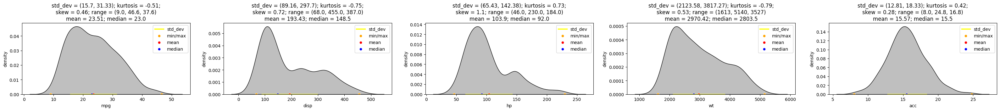

In [38]:
uva_num(data,num_cols)

- We can observe from the above that the distributions are slightly or moderately,positively skewed and thus we can sense prescence of few outliers.
- As the distributions are positively skewed, we can infer that vehicles with high configuartions are less in number compared to low ones.
- Most distributions are platykurtic excpet for acc, hp which resembles leptokurtic.Despite this the kurtosis values are very close to that of a normal distribution.
- Rest statistical parameters can be observed accordingly.

In [39]:
# Custom function for outlier analysis

def uva_outlier(data, data_group, include_outlier = True):
  
  '''
  Univariate Analysis for Outlier:
  takes a group of variables (INTEGER and FLOAT) and plot boxplot and descriptives\n
  
  data : dataframe from which to plot from\n
  
  data_group : {list} type Group of Continuous variables\n
  
  include_outlier : {bool} whether to include outliers or not, default = True\n
  '''

  size = len(data_group)
  plt.figure(figsize = (7*size,4), dpi = 100)
  
  # Looping for each variable
  
  for j,i in enumerate(data_group):
    
    # Calculating the descriptives
    
    quant25 = data[i].quantile(0.25)
    quant75 = data[i].quantile(0.75)
    IQR = quant75 - quant25
    med = data[i].median()
    whis_low = med-(1.5*IQR)
    whis_high = med+(1.5*IQR)

    # Calculating number of outliers
    outlier_high = len(data[i][data[i]>whis_high])
    outlier_low = len(data[i][data[i]<whis_low])

    if include_outlier == True:
      
      # Plotting with every information
      
      plt.subplot(1,size,j+1)
      sns.boxplot(data[i], orient="v",color='aqua')
      plt.ylabel('{}'.format(i))
      plt.title('With Outliers\nIQR = {}; Median = {} \n 2nd,3rd  quartile = {};\n Outlier (low/high) = {} \n'.format(
                                                                                                   round(IQR,2),
                                                                                                   round(med,2),
                                                                                                   (round(quant25,2),round(quant75,2)),
                                                                                                   (outlier_low,outlier_high)
                                                                                                   ))
      
    else:
      
      # Replacing outliers with max/min whisker
      
      data2 = data[data_group][:]
      data2[i][data2[i]>whis_high] = whis_high+1
      data2[i][data2[i]<whis_low] = whis_low-1
      
      # Plotting without outliers
        
      plt.subplot(1,size,j+1)
      sns.boxplot(data2[i], orient="v",color='lightblue')
      plt.ylabel('{}'.format(i))
      plt.title('Without Outliers\nIQR = {}; Median = {} \n 2nd,3rd  quartile = {};\n Outlier (low/high) = {} \n'.format(
                                                                                                   round(IQR,2),
                                                                                                   round(med,2),
                                                                                                   (round(quant25,2),round(quant75,2)),
                                                                                                   (outlier_low,outlier_high)
                                                                                                   ))

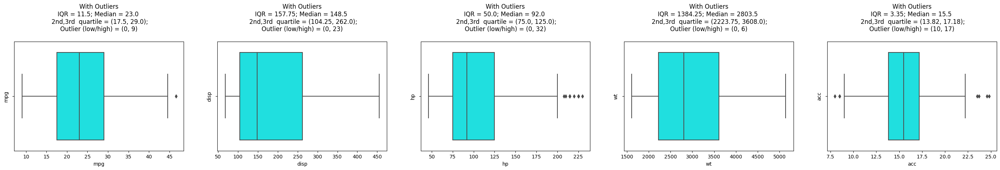

In [40]:
uva_outlier(data, num_cols)

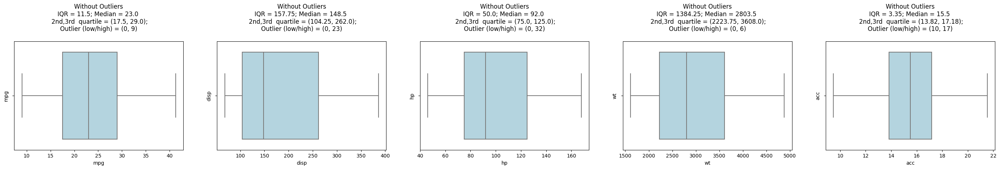

In [41]:
# Representation of data with outliers removed

uva_outlier(data, num_cols,include_outlier=False)

- We can see outliers present in the data but such outliers will be present in a vehicular data as some of them will be high or average or low performing.
- We shall handle outliers later.

In [42]:
# Percentage of each of the classes in the data for categoricals

for i in data[cat_cols].columns:
    print(data[i].value_counts(normalize=True)*100)
    print('\n**************************************\n')

4    51.256281
8    25.879397
6    21.105528
3     1.005025
5     0.753769
Name: cyl, dtype: float64

**************************************

73    10.050251
78     9.045226
76     8.542714
82     7.788945
75     7.537688
70     7.286432
79     7.286432
80     7.286432
81     7.286432
71     7.035176
72     7.035176
77     7.035176
74     6.783920
Name: yr, dtype: float64

**************************************

1    62.562814
3    19.849246
2    17.587940
Name: origin, dtype: float64

**************************************



In [43]:
def uva_cat(data, var_group):

  '''
  Univariate Analysis for Categorical:
  
  takes a group of variables (category) and plot all the value_counts and barplot along with descriptives.
  '''
  
  size = len(var_group)
  plt.figure(figsize = (9*size,2), dpi = 100)

  # Loop for every variable

  for j,i in enumerate(var_group):
    norm_count = data[i].value_counts(normalize = True)
    n_uni = data[i].nunique()

  #Plotting the variable with every information
    
    plt.subplot(1,size,j+1)
    sns.barplot(norm_count, norm_count.index , order = norm_count.index,palette='viridis')
    plt.xlabel('Fraction/Percent', fontsize = 15)
    plt.ylabel('{}'.format(i), fontsize = 15)
    plt.title('n_uniques = {} \n value counts \n {};'.format(n_uni,norm_count))
    

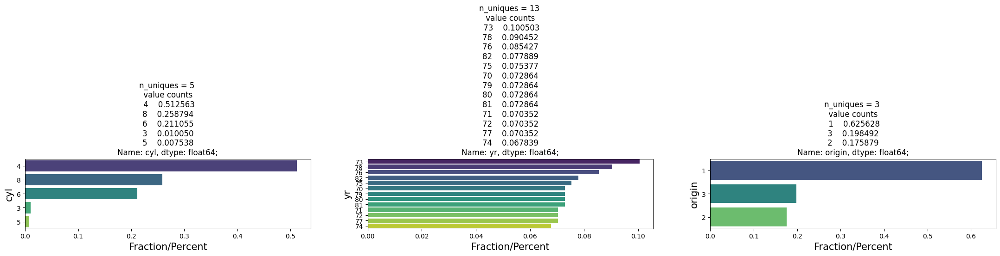

In [44]:
uva_cat(data, cat_cols)

- We can observe that the most of the cars have higher number of cylinders.
- Few years have more car launches than the most.
- A particular origin, specifically 1 has highest numbers of associated cars and for rest it's equally distributed.

In [45]:
# Calculating correlation

corr = data[num_cols].corr()
corr

,mpg,disp,hp,wt,acc
mpg,1.000000,-0.804203,-0.774419,-0.831741,0.420289
disp,-0.804203,1.000000,0.896410,0.932824,-0.543684
hp,-0.774419,0.896410,1.000000,0.862608,-0.688744
wt,-0.831741,0.932824,0.862608,1.000000,-0.417457
acc,0.420289,-0.543684,-0.688744,-0.417457,1.000000


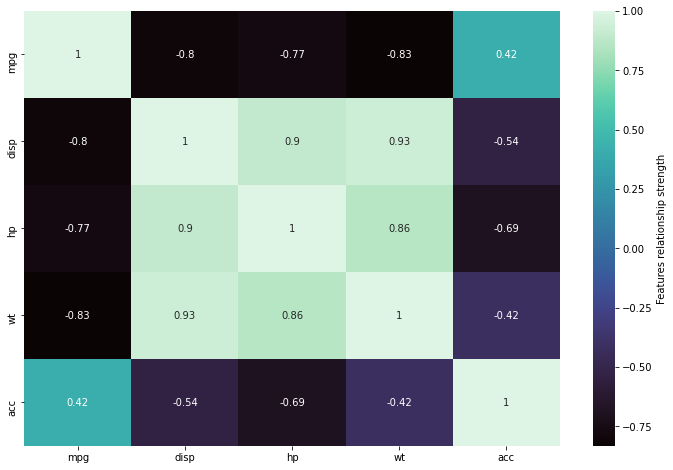

In [46]:
# Plotting the heatmap for the respective correlation

plt.figure(figsize=(12,8))

sns.heatmap(corr,annot=True,cbar_kws={'label': 'Features relationship strength'},cmap='mako');

In [47]:
# Representing correlation values in hierarchy (Descending order)

df_corr = pd.DataFrame(corr.abs().unstack().sort_values(ascending=False),columns=['Correlation'])
df_corr[df_corr['Correlation'] < 1]

Correlation
disp wt       0.932824
wt   disp     0.932824
disp hp       0.896410
hp   disp     0.896410
     wt       0.862608
wt   hp       0.862608
mpg  wt       0.831741
wt   mpg      0.831741
mpg  disp     0.804203
disp mpg      0.804203
mpg  hp       0.774419
hp   mpg      0.774419
acc  hp       0.688744
hp   acc      0.688744
acc  disp     0.543684
disp acc      0.543684
acc  mpg      0.420289
mpg  acc      0.420289
wt   acc      0.417457
acc  wt       0.417457

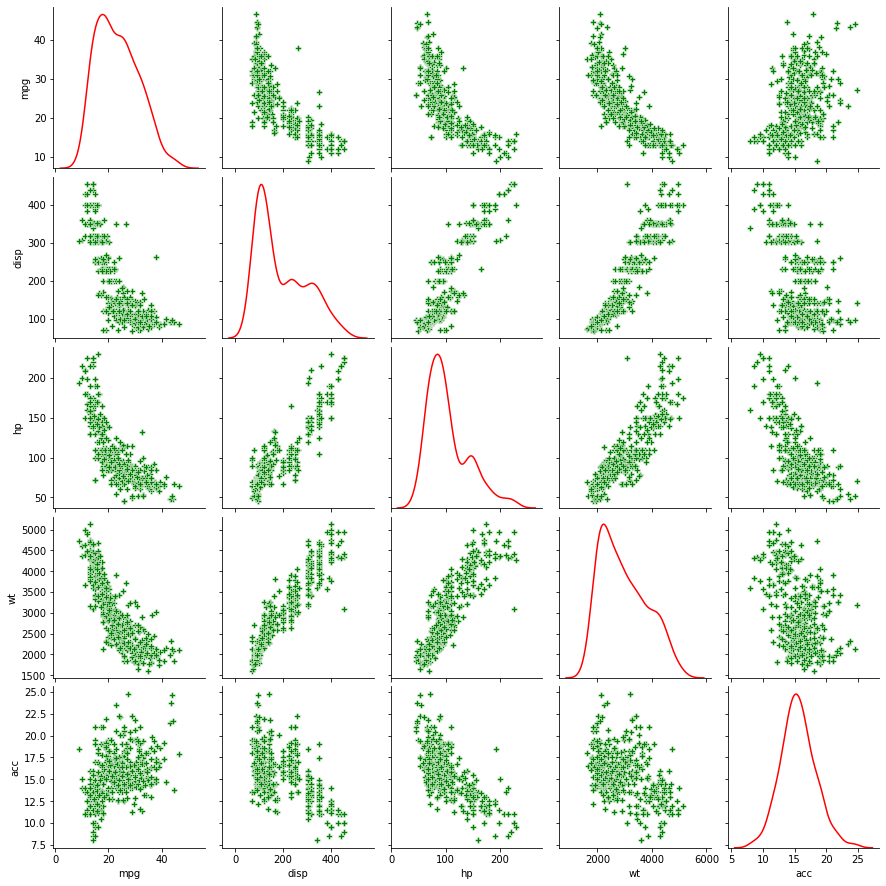

In [48]:
# Plot to check the correlation

sns.pairplot(data,diag_kind='kde',plot_kws=dict(marker="P", linewidth=0.5,color='green'),diag_kws=dict(fill=False,color='red'));

Observation from Correlation Matrix,Pair Plots and Heatmap :
- We can lots of strong correlation between the given variables be it positive or negative.
- It can be observed that, when disp, wt and hp increases the mpg decreases. When acc increases the mpg increases though there is not strong evidence to say so.
- Finally, given the context we can also see that there are minimum three clusters in our data as same can be inferred from the diagonals.

- Grouping by origin and checking the distribution for every variable

AxesSubplot(0.125,0.125;0.775x0.755)


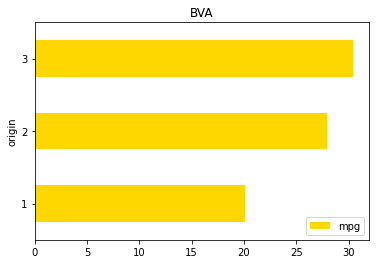

AxesSubplot(0.125,0.125;0.775x0.755)


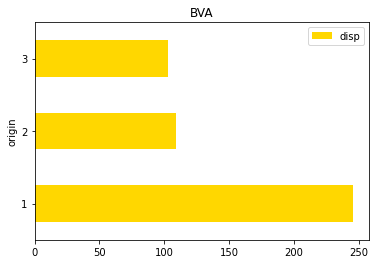

AxesSubplot(0.125,0.125;0.775x0.755)


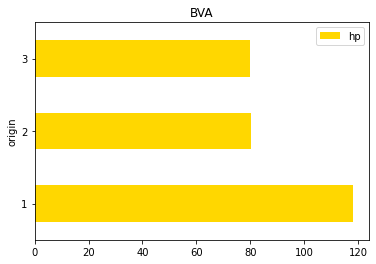

AxesSubplot(0.125,0.125;0.775x0.755)


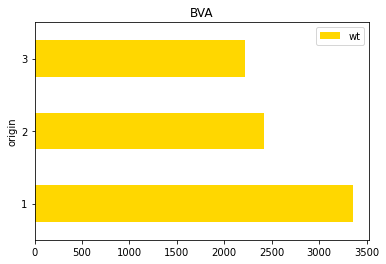

AxesSubplot(0.125,0.125;0.775x0.755)


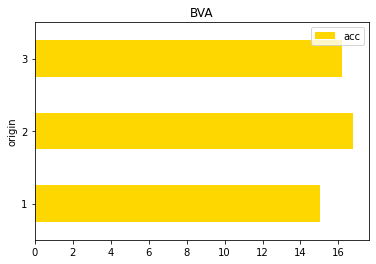

In [49]:
for i in num_cols:
    print(data[['origin',i]].groupby('origin').mean().plot(kind='barh',color='gold'));
    plt.title('BVA');
    plt.show();

- Grouping by cyl and checking the distribution for every variable

AxesSubplot(0.125,0.125;0.775x0.755)


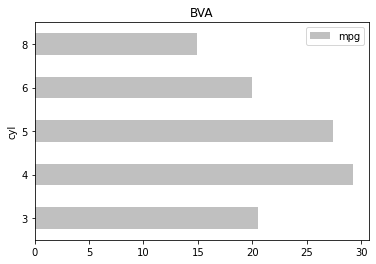

AxesSubplot(0.125,0.125;0.775x0.755)


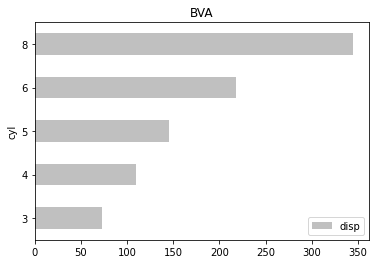

AxesSubplot(0.125,0.125;0.775x0.755)


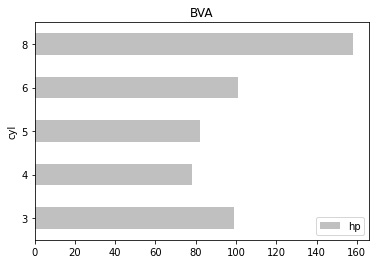

AxesSubplot(0.125,0.125;0.775x0.755)


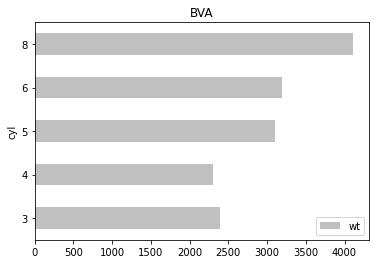

AxesSubplot(0.125,0.125;0.775x0.755)


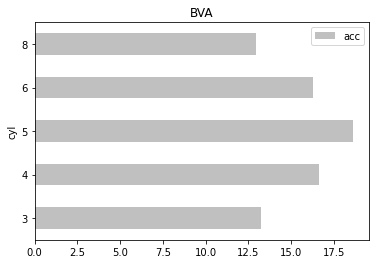

In [50]:
for i in num_cols:
    print(data[['cyl',i]].groupby('cyl').mean().plot(kind='barh',color = 'silver'));
    plt.title('BVA');
    plt.show();

- Grouping by yr and checking the distribution for every variable

AxesSubplot(0.125,0.125;0.775x0.755)


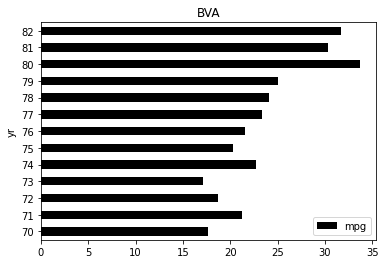

AxesSubplot(0.125,0.125;0.775x0.755)


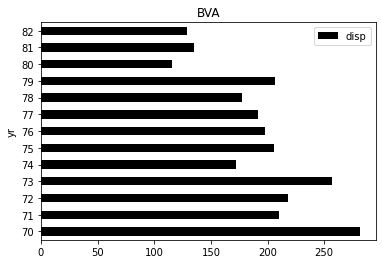

AxesSubplot(0.125,0.125;0.775x0.755)


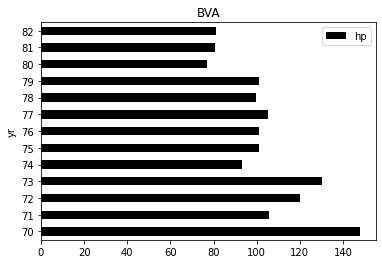

AxesSubplot(0.125,0.125;0.775x0.755)


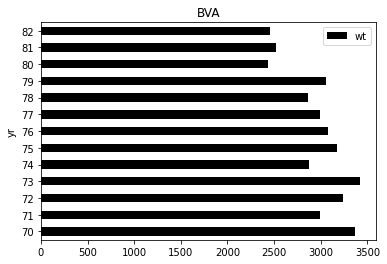

AxesSubplot(0.125,0.125;0.775x0.755)


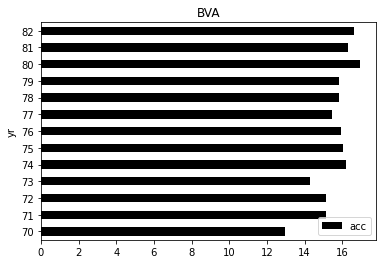

In [51]:
for i in num_cols:
    print(data[['yr',i]].groupby('yr').mean().plot(kind='barh',color =  'black'));
    plt.title('BVA');
    plt.show();

- As we will see, all the above graphs will be referred for analysis later.

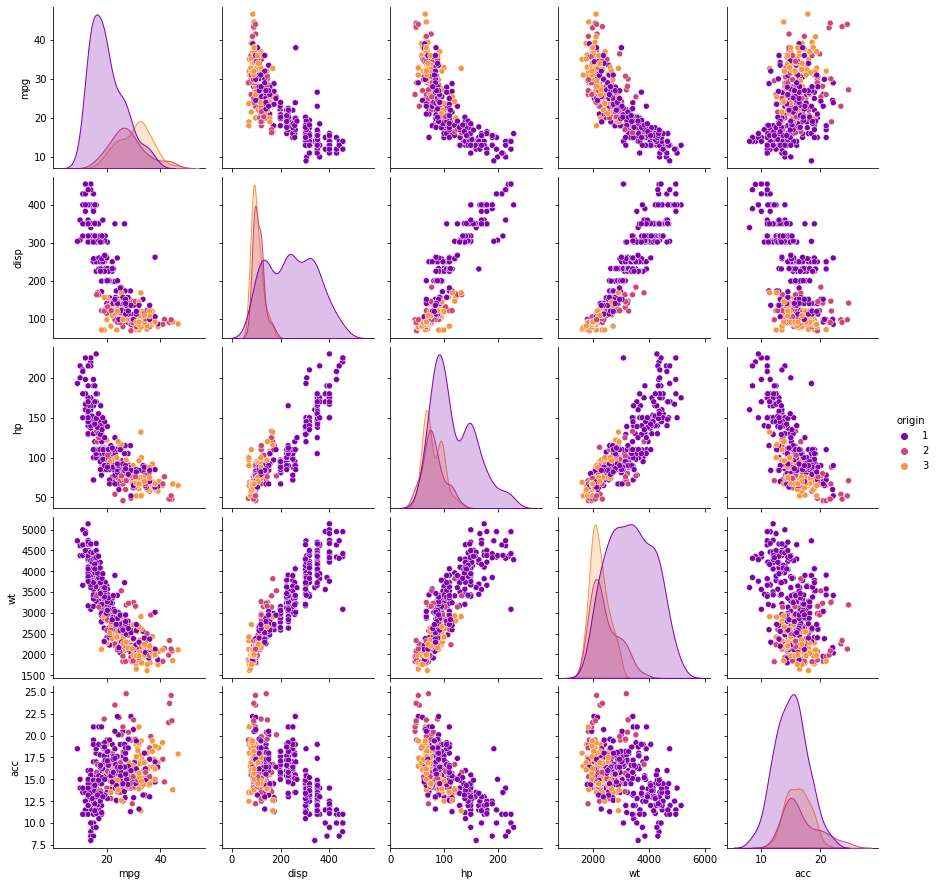

In [52]:
# Plot to check the correlation
# Distribution of variables categorised by origin 

sns.pairplot(data,hue='origin',palette='plasma');

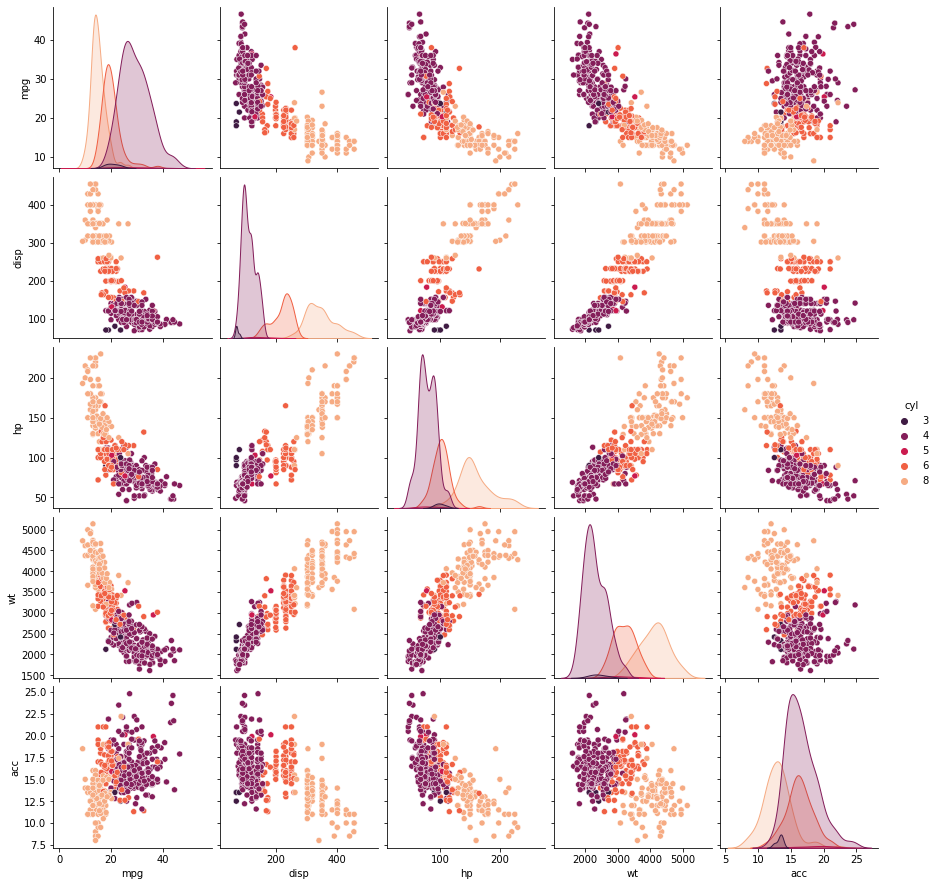

In [53]:
# Plot to check the correlation
# Distribution of variables categorised by cyl 

sns.pairplot(data,hue='cyl',palette='rocket');

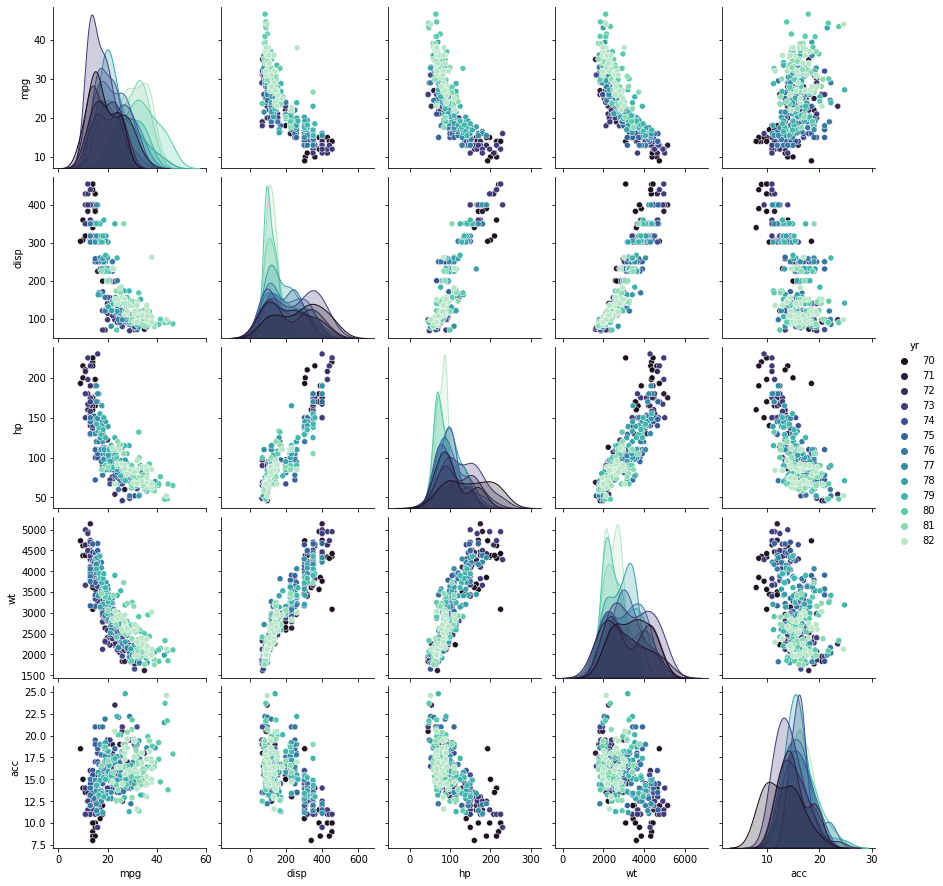

In [54]:
# Plot to check the correlation
# Distribution of variables categorised on yr

sns.pairplot(data,hue='yr',palette='mako');

- We can see splitting of distribution makes based on cyl as its more distinct but anyways we will be using the appropriate algorithm to do the same.

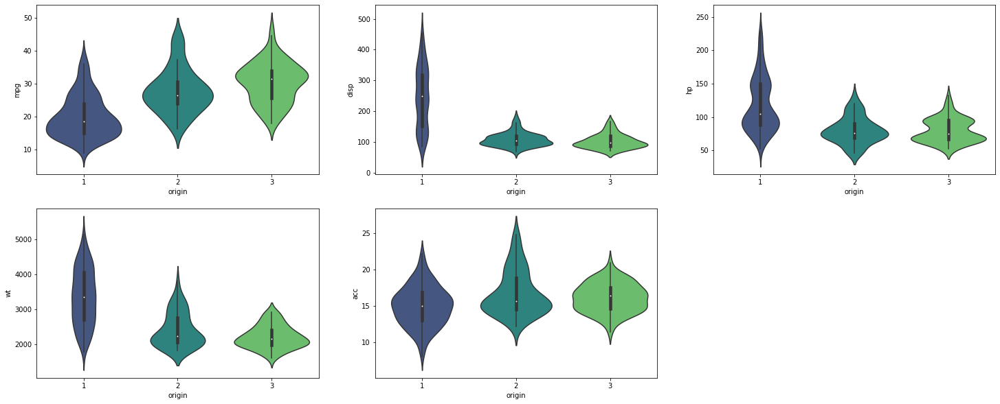

In [55]:
# Creating plot for each numerical variable after filtering

plt.figure(figsize=(25,10))
for i, j in enumerate(data[num_cols]):
    plt.subplot(2,3,i+1)
    sns.violinplot(x='origin', y=j, data=data,palette='viridis')

- We can observe mpg is lower for origin 1, which might be due to reason that origin 1 has highest number of vehicles and due to traffic mpg goes down. Other evident reason is that origin 1 has high performing cars which can be seen above. Same principle can be applied to the other origins. 

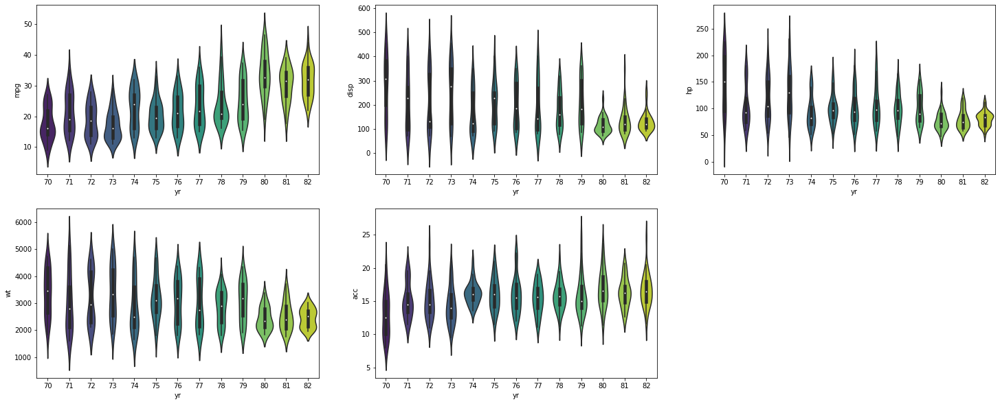

In [56]:
# Creating plot for each numerical variable after filtering

plt.figure(figsize=(25,10))
for i, j in enumerate(data[num_cols]):
    plt.subplot(2,3,i+1)
    sns.violinplot(x='yr', y=j, data=data,palette='viridis')

- We can see mpg is increasing year by year, maybe because of technlogical improvements.
- Vehichles are becoming lighter and compact(feature-wise) with time.

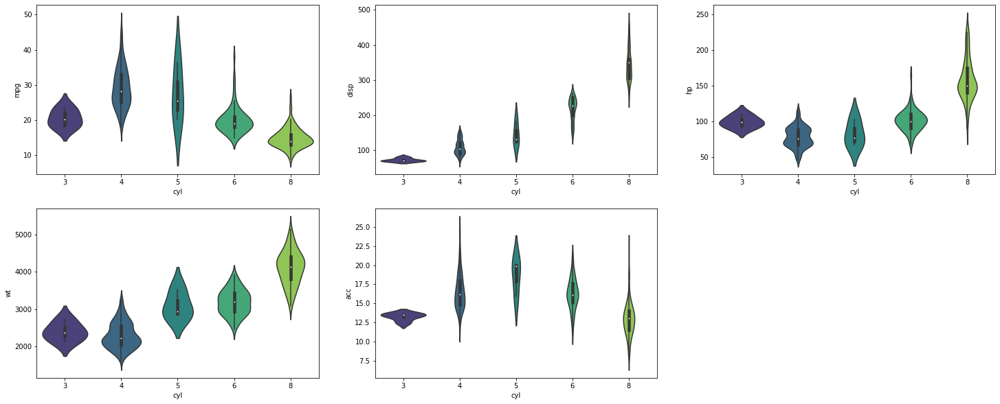

In [57]:
# Creating plot for each numerical variable after filtering

plt.figure(figsize=(25,10))
for i, j in enumerate(data[num_cols]):
    plt.subplot(2,3,i+1)
    sns.violinplot(x='cyl', y=j, data=data,palette='viridis')

- We can see for optimal mpg, the number of cylinders can neither be too low or high.
- Also, as the number of cylinders increases the value for most other components also increase.

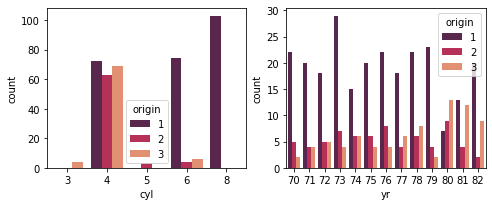

In [58]:
# Creating plot for each categorical variable after filtering

plt.figure(figsize=(25,10))
for i, j in enumerate(data[cat_cols[0:2]]):
    plt.subplot(3,6,i+1)
    sns.countplot(x = j, data = data,hue='origin',palette='rocket')

- As already seen, origin 1 has high performance vehicles and hence we can see the number of cylinders highest for them.
- Every year origin 1 sees most of the cars being launced and it's very high compared to the others.

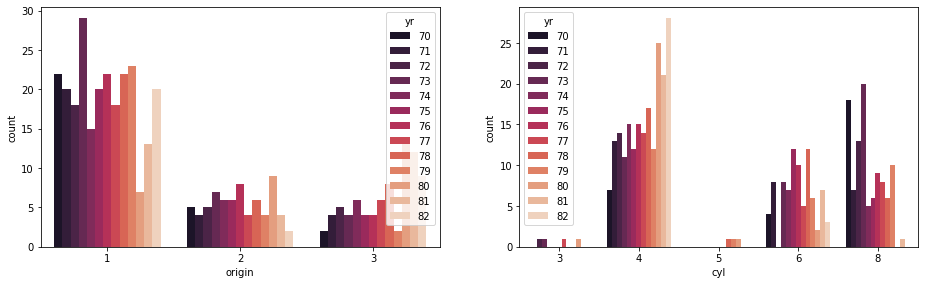

In [59]:
# Creating plot for each categorical variable after filtering

plt.figure(figsize=(50,15))
for i, j in enumerate(data[['origin','cyl']]):
    plt.subplot(3,6,i+1)
    sns.countplot(x = j, data = data,hue='yr',palette='rocket')

- The above shows the usage of number of cylinders with time.

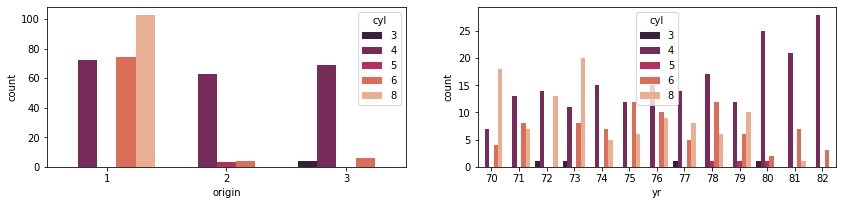

In [60]:
# Creating plot for each categorical variable after filtering

plt.figure(figsize=(45,10))
for i, j in enumerate(data[['origin','yr']]):
    plt.subplot(3,6,i+1)
    sns.countplot(x = j, data = data,hue='cyl',palette='rocket')

- We can see that average performing vehicles are same for most of the origins. In case of origin 1, they have quite a lot of high performing vehicles as well compared to others.
- We can see the numbers of cylinders being used, increasing and decreasing in numbers with time. This might be due to scientific experimentation in the vehicle production company. 

## 4. Machine learning: 

### <center>Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.  

- Doing some pre-processing before modelling.

In [61]:
data.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   mpg     398 non-null    float64 
 1   cyl     398 non-null    category
 2   disp    398 non-null    float64 
 3   hp      398 non-null    float64 
 4   wt      398 non-null    int64   
 5   acc     398 non-null    float64 
 6   yr      398 non-null    category
 7   origin  398 non-null    category
dtypes: category(3), float64(4), int64(1)
memory usage: 17.8 KB


In [63]:
data['cyl'] = data['cyl'].astype('int')

In [64]:
data['yr'] = data['yr'].astype('int')

In [65]:
one_hot = pd.get_dummies(data['origin'],prefix='Origin')

In [66]:
data

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1
...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790,15.6,82,1
394,44.0,4,97.0,52.0,2130,24.6,82,2
395,32.0,4,135.0,84.0,2295,11.6,82,1
396,28.0,4,120.0,79.0,2625,18.6,82,1


In [67]:
data.drop(['origin'],axis=1,inplace=True)

In [68]:
data.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504,12.0,70
1,15.0,8,350.0,165.0,3693,11.5,70
2,18.0,8,318.0,150.0,3436,11.0,70
3,16.0,8,304.0,150.0,3433,12.0,70
4,17.0,8,302.0,140.0,3449,10.5,70


In [69]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
dtypes: float64(4), int64(3)
memory usage: 21.9 KB


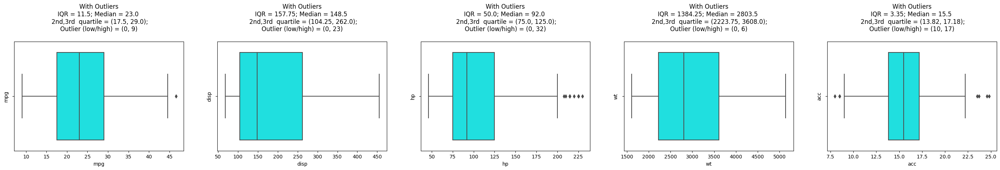

In [70]:
uva_outlier(data, num_cols)

In [71]:
# Replacing outliers with upper whisker value

for i in num_cols:
    data[i].quantile(0.25), data[i].quantile(0.75)
    IQR = data[i].quantile(0.75) - data[i].quantile(0.25)
    Q1 = data[i].quantile(0.25)
    Q3 = data[i].quantile(0.75)
    whisker_1 = Q1 - (1.5*IQR)
    whisker_2 = Q3 + (1.5*IQR)
    data[i].loc[data[i]>whisker_2] = whisker_2
    data[i].loc[data[i]<whisker_1] = whisker_1

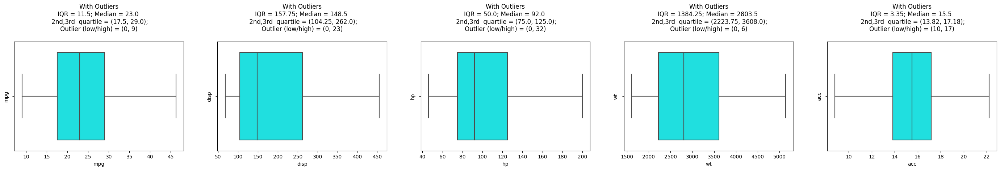

In [72]:
uva_outlier(data, num_cols)

In [73]:
data

,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504.0,12.0,70
1,15.0,8,350.0,165.0,3693.0,11.5,70
2,18.0,8,318.0,150.0,3436.0,11.0,70
3,16.0,8,304.0,150.0,3433.0,12.0,70
4,17.0,8,302.0,140.0,3449.0,10.5,70
...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790.0,15.6,82
394,44.0,4,97.0,52.0,2130.0,22.2,82
395,32.0,4,135.0,84.0,2295.0,11.6,82
396,28.0,4,120.0,79.0,2625.0,18.6,82


In [74]:
# Scaling the data

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
new_num_cols = data.select_dtypes(include=numerics).columns.to_list()
data_scaled = StandardScaler().fit_transform(data)
data_scaled = pd.DataFrame(data_scaled, columns=new_num_cols)

In [75]:
data_scaled

,mpg,cyl,disp,hp,wt,acc,yr
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426
...,...,...,...,...,...,...,...
393,0.446757,-0.856321,-0.513026,-0.470065,-0.213324,0.017842,1.621983
394,2.625245,-0.856321,-0.925936,-1.386888,-0.993671,2.471644,1.621983
395,1.087489,-0.856321,-0.561039,-0.523996,-0.798585,-1.469311,1.621983
396,0.574904,-0.856321,-0.705077,-0.658823,-0.408411,1.133207,1.621983


In [76]:
data_scaled = pd.concat([data_scaled,one_hot],axis=1)

In [77]:
data_scaled

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,1,0,0
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,1,0,0
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,1,0,0
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,1,0,0
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,1,0,0
...,...,...,...,...,...,...,...,...,...,...
393,0.446757,-0.856321,-0.513026,-0.470065,-0.213324,0.017842,1.621983,1,0,0
394,2.625245,-0.856321,-0.925936,-1.386888,-0.993671,2.471644,1.621983,0,1,0
395,1.087489,-0.856321,-0.561039,-0.523996,-0.798585,-1.469311,1.621983,1,0,0
396,0.574904,-0.856321,-0.705077,-0.658823,-0.408411,1.133207,1.621983,1,0,0


<center><b><u>K-means Clustering</u></b>

In [78]:
data.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504.0,12.0,70
1,15.0,8,350.0,165.0,3693.0,11.5,70
2,18.0,8,318.0,150.0,3436.0,11.0,70
3,16.0,8,304.0,150.0,3433.0,12.0,70
4,17.0,8,302.0,140.0,3449.0,10.5,70


In [79]:
data_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,1,0,0
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,1,0,0
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,1,0,0
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,1,0,0
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,1,0,0


In [80]:
# Scaling

kc_data = data.copy()
kc_data_scaled = data_scaled.copy()

In [81]:
# Creating n clusters to select the best

cluster_range = range(1,10)
cluster_errors = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 10)
    clusters.fit(kc_data_scaled)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)

clusters_df = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": cluster_errors})
clusters_df

,num_clusters,cluster_errors
0,1,3000.226131
1,2,1462.760391
2,3,1096.454179
3,4,880.776931
4,5,795.894909
5,6,727.620007
6,7,667.948795
7,8,623.668030
8,9,581.582944


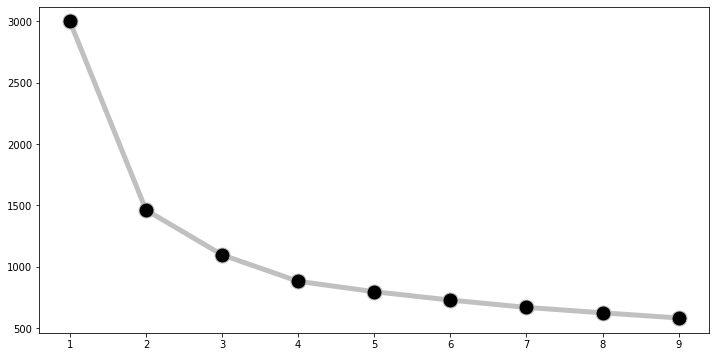

In [82]:
# Elbow plot

plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o", color = 'silver', markerfacecolor='black', markersize=15, linewidth=5)

We can see that optimal number of clusters can be 3 or 4. So, let's check silhoutte score to choose one. 

In [83]:
kmeans = KMeans(n_clusters=4, n_init = 10, random_state=101)
kmeans.fit(kc_data_scaled)

KMeans(n_clusters=4, random_state=101)

In [84]:
# Check the number of data in each cluster

labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[114  91  95  98]


In [85]:
# Calculating silhouette_score

silhouette_score(kc_data_scaled,labels)

0.32515282152275726

In [86]:
kmeans = KMeans(n_clusters=3, n_init = 10, random_state=101)
kmeans.fit(kc_data_scaled)

KMeans(n_clusters=3, random_state=101)

In [87]:
# Check the number of data in each cluster

labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[ 94 213  91]


In [88]:
# Calculating silhouette_score

silhouette_score(kc_data_scaled,labels)

0.3307407893666982

As, silhouette score is higher for 3. So, we will continue with 3 clusters.

In [89]:
# Let us check the centriods

centroids = kmeans.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns = list(kc_data_scaled) )
centroid_df.transpose()

,0,1,2
mpg,-1.164069e+00,0.730033,-0.506313
cyl,1.498191e+00,-0.842503,0.424430
disp,1.503923e+00,-0.794453,0.306042
hp,1.535988e+00,-0.670090,-0.018172
wt,1.404098e+00,-0.759290,0.326851
acc,-1.100687e+00,0.364321,0.284222
yr,-6.883238e-01,0.308744,-0.011648
Origin_1,1.000000e+00,0.342723,0.901099
Origin_2,-2.498002e-16,0.309859,0.043956
Origin_3,8.326673e-17,0.347418,0.054945


In [90]:
# Adding cluster number to original data

predictions = kmeans.predict(kc_data_scaled)
kc_data['labels'] = predictions
kc_data['labels'] = kc_data['labels'].astype('category')

In [91]:
kc_data = pd.concat([kc_data,one_hot],axis=1)

In [92]:
kc_data

,mpg,cyl,disp,hp,wt,acc,yr,labels,Origin_1,Origin_2,Origin_3
0,18.0,8,307.0,130.0,3504.0,12.0,70,0,1,0,0
1,15.0,8,350.0,165.0,3693.0,11.5,70,0,1,0,0
2,18.0,8,318.0,150.0,3436.0,11.0,70,0,1,0,0
3,16.0,8,304.0,150.0,3433.0,12.0,70,0,1,0,0
4,17.0,8,302.0,140.0,3449.0,10.5,70,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790.0,15.6,82,1,1,0,0
394,44.0,4,97.0,52.0,2130.0,22.2,82,1,0,1,0
395,32.0,4,135.0,84.0,2295.0,11.6,82,1,1,0,0
396,28.0,4,120.0,79.0,2625.0,18.6,82,1,1,0,0


In [93]:
kc_data_scaled_2 = kc_data_scaled.apply(zscore)

In [94]:
kc_data_scaled_2['labels'] = predictions

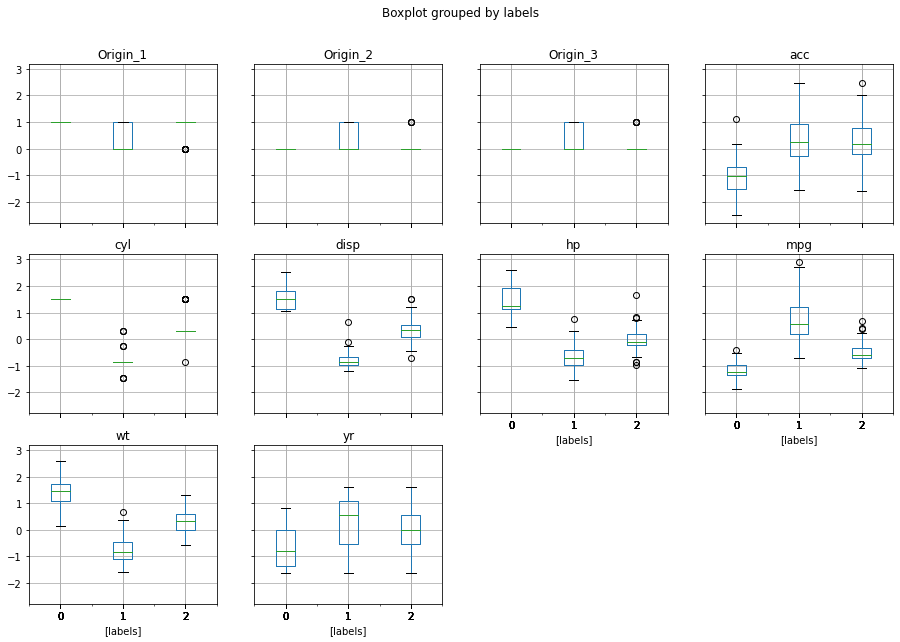

In [95]:
# Box plot to visualize the clusters

kc_data_scaled['labels'] = predictions
kc_data_scaled.boxplot(by = 'labels',  layout=(3,4), figsize=(15, 10));

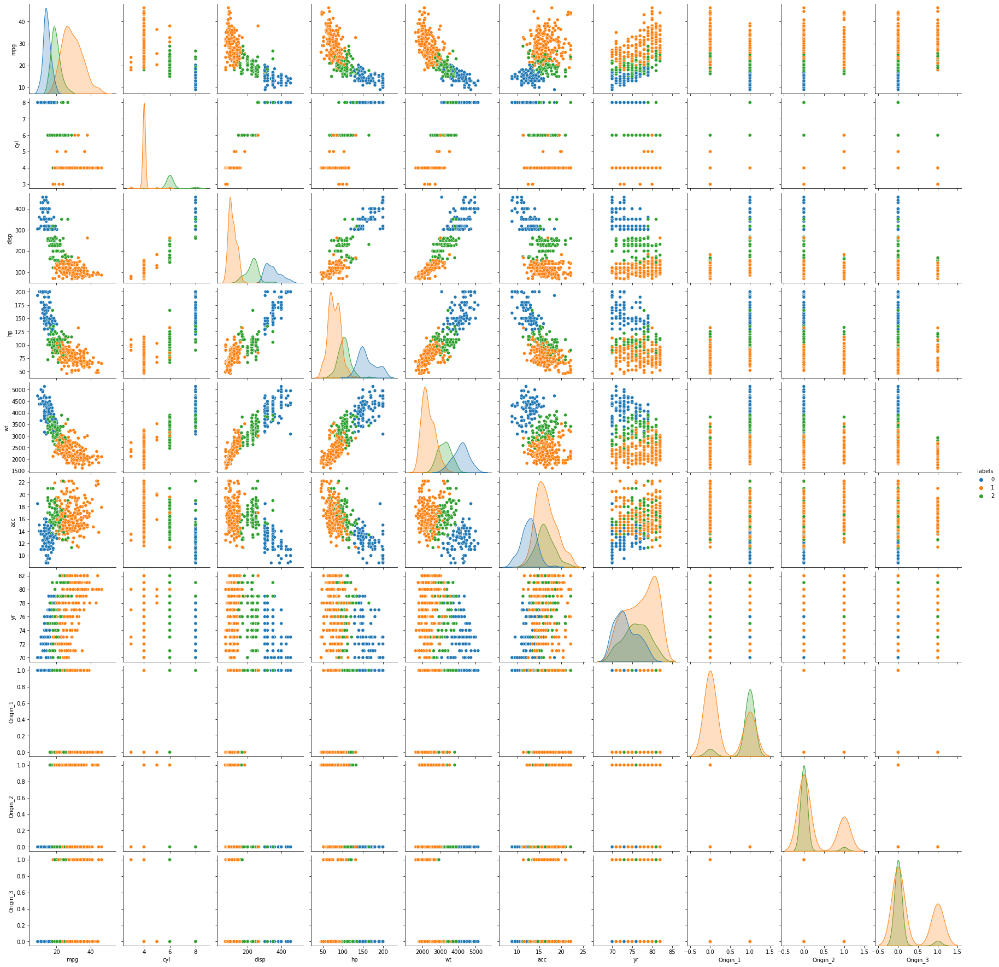

In [96]:
# Pair plot to visualize the distribution of clusters

sns.pairplot(kc_data,diag_kind='kde',hue='labels');

In [97]:
kc_data[['mpg', 'disp', 'hp', 'wt','acc','labels','yr','cyl']].groupby('labels').mean()

,mpg,disp,hp,wt,acc,yr,cyl
labels,,,,,,,
0,14.429787,350.042553,160.393617,4157.978723,12.591489,73.468085,8.000000
1,29.210563,110.692488,78.582160,2328.234742,16.531925,77.150235,4.023474
2,19.562637,225.296703,102.758242,3246.868132,16.316484,75.967033,6.175824


Inferences from the above visualizations and data :
- The three clusters 0,2,1 can be visualised as high, average and low performance cars.
- We can also see as performance is high, the mpg is low respectively.
- Cluster 0 has highest value for disp, hp, wt, cyl
- As cluster 0 represnts heavier cars hence acc is lesser for these when compared to the others.
- Newest cars belong to cluster 1.

<center><b><u>Hierarchical Clustering</u></b>

In [98]:
data.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504.0,12.0,70
1,15.0,8,350.0,165.0,3693.0,11.5,70
2,18.0,8,318.0,150.0,3436.0,11.0,70
3,16.0,8,304.0,150.0,3433.0,12.0,70
4,17.0,8,302.0,140.0,3449.0,10.5,70


In [99]:
data_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,1,0,0
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,1,0,0
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,1,0,0
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,1,0,0
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,1,0,0


In [100]:
# Scaling

hc_data = data.copy()
hc_data_scaled = data_scaled.copy()

In [101]:
# Model

model = AgglomerativeClustering()

In [102]:
# Fitting the model

mfit = model.fit(hc_data_scaled)

In [103]:
def plot_dendrogram(model):
    # Children of hierarchical clustering
    children = model.children_

    # Distances between each pair of children
    # Since we don't have this information, we can use a uniform one for plotting
    distance = np.arange(children.shape[0])

    # The number of observations contained in each cluster level
    no_of_observations = np.arange(2, children.shape[0]+2)

    # Create linkage matrix and then plot the dendrogram
    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix)

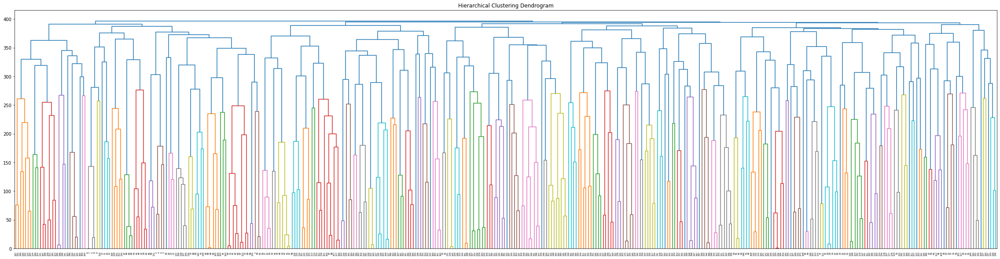

In [104]:
plt.figure(figsize=(40,10))
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(mfit)

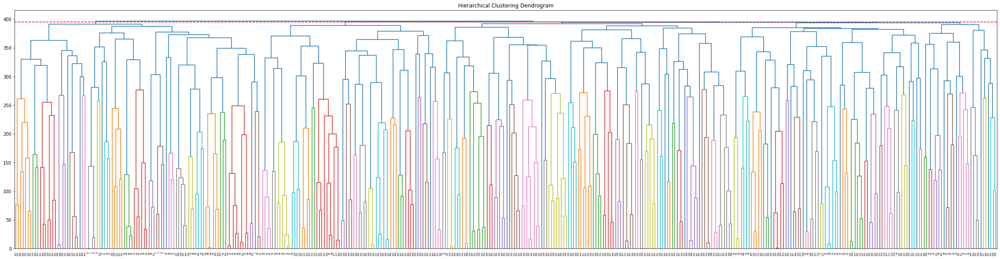

In [105]:
# Seclecting the threshold as per 3 clusters

plt.figure(figsize=(40,10))
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(mfit)
plt.axhline(y=395, color='r', linestyle='--')

In [106]:
# Calculating cophenet index 
# Closer it is to 1, the better is the clustering

Z = linkage(hc_data_scaled, metric='euclidean', method='complete')
c, coph_dists = cophenet(Z , pdist(hc_data_scaled))

c

0.7439298074513135

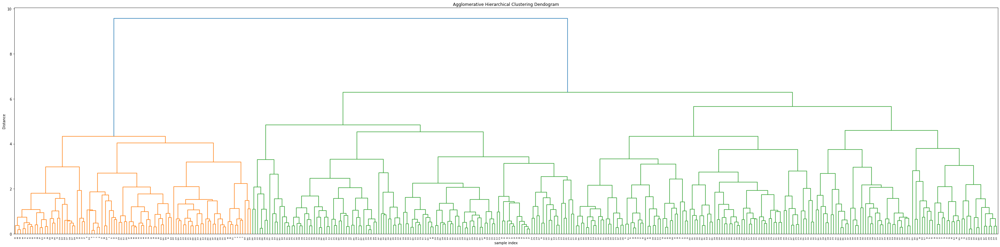

In [107]:
plt.figure(figsize=(40, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90)
plt.tight_layout()

In [108]:
# Calculating cophenet index 
# Closer it is to 1, the better is the clustering

Z = linkage(hc_data_scaled, metric='euclidean', method='ward')
c, coph_dists = cophenet(Z , pdist(hc_data_scaled))

c

0.7595843923735612

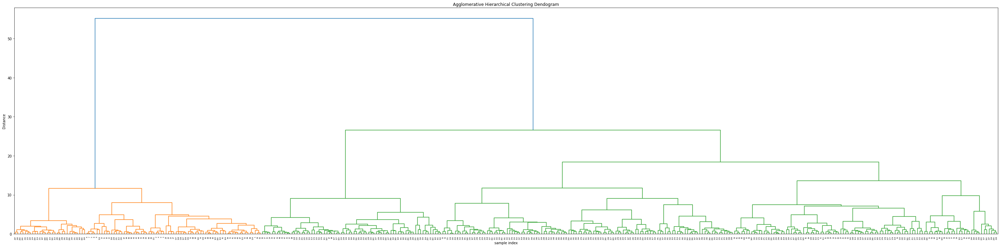

In [109]:
plt.figure(figsize=(40, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90)
plt.tight_layout()

In [110]:
# Calculating cophenet index 
# Closer it is to 1, the better is the clustering

Z = linkage(hc_data_scaled, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(hc_data_scaled))

c

0.7766169401216143

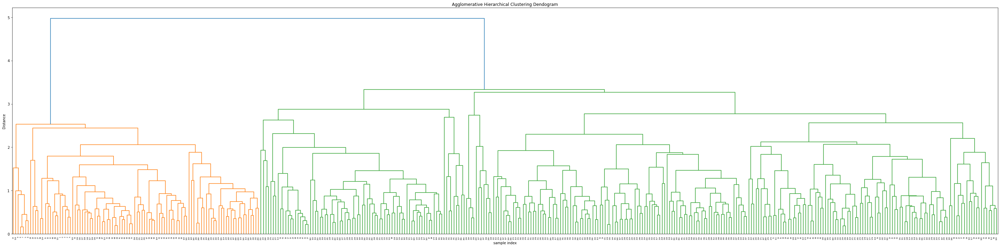

In [111]:
plt.figure(figsize=(40, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90)
plt.tight_layout()

In [112]:
# Model with 4 clusters

model = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='average')

In [113]:
model.fit(hc_data_scaled)

AgglomerativeClustering(linkage='average', n_clusters=4)

In [114]:
hc_data = pd.concat([hc_data,one_hot],axis=1)

In [115]:
hc_data.head()

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,0,0
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,0,0
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,0,0
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,0,0
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,0,0


In [116]:
hc_data['labels'] = model.labels_
hc_data.head(10)

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,0,0,3
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,0,0,3
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,0,0,3
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,0,0,3
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,0,0,3
5,15.0,8,429.0,198.0,4341.0,10.0,70,1,0,0,3
6,14.0,8,454.0,200.0,4354.0,9.0,70,1,0,0,3
7,14.0,8,440.0,200.0,4312.0,8.8,70,1,0,0,3
8,14.0,8,455.0,200.0,4425.0,10.0,70,1,0,0,3
9,15.0,8,390.0,190.0,3850.0,8.8,70,1,0,0,3


In [117]:
# Checking the number of data in each cluster

labels = model.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[ 83  11 204 100]


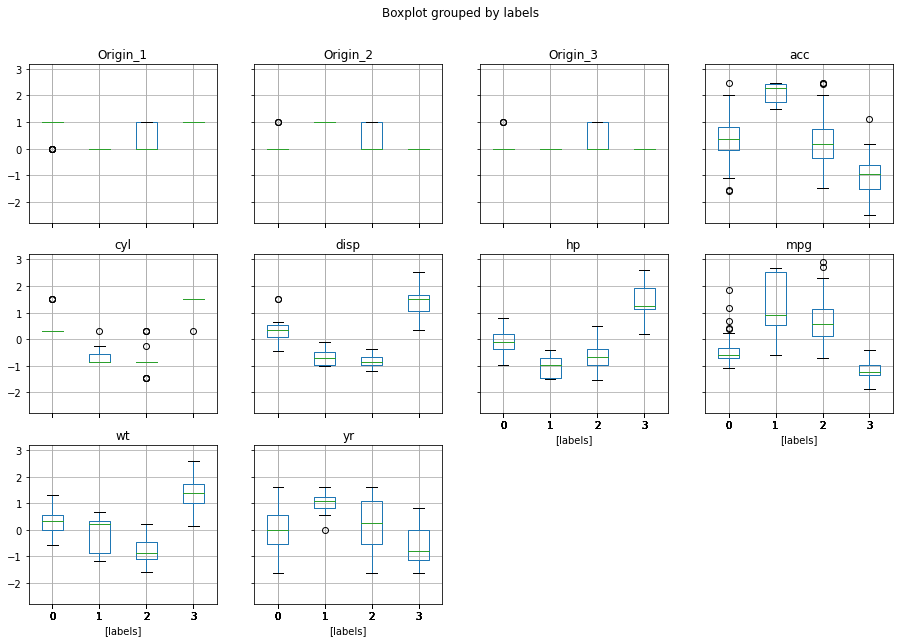

In [118]:
# Visualize the centers

hc_data_scaled["labels"] = model.labels_
hc_data_scaled.boxplot(by = 'labels',  layout=(3,4), figsize=(15, 10));

In [119]:
hc_data

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,0,0,3
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,0,0,3
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,0,0,3
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,0,0,3
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790.0,15.6,82,1,0,0,2
394,44.0,4,97.0,52.0,2130.0,22.2,82,0,1,0,1
395,32.0,4,135.0,84.0,2295.0,11.6,82,1,0,0,2
396,28.0,4,120.0,79.0,2625.0,18.6,82,1,0,0,2


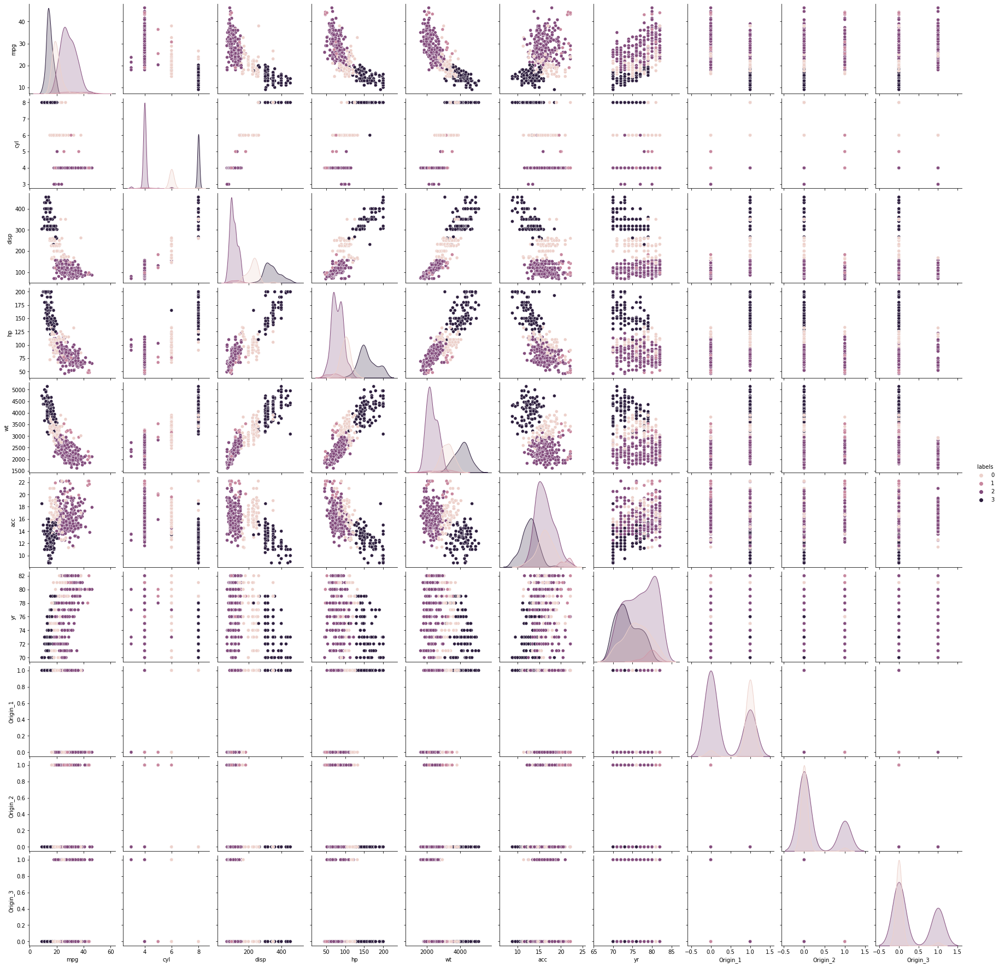

In [120]:
# Pair plot to check the distribution of the clusters

sns.pairplot(hc_data,diag_kind='kde',hue='labels');

In [121]:
hc_data[['mpg', 'disp', 'hp', 'wt','acc','labels','yr','cyl']].groupby('labels').mean()

,mpg,disp,hp,wt,acc,yr,cyl
labels,,,,,,,
0,19.998795,225.421687,100.650602,3236.132530,16.472289,76.012048,6.096386
1,33.781818,124.000000,65.636364,2828.636364,21.227273,79.636364,4.363636
2,28.718382,109.620098,79.598039,2305.681373,16.261765,76.926471,4.014706
3,14.684000,345.470000,158.520000,4121.560000,12.716000,73.740000,7.980000


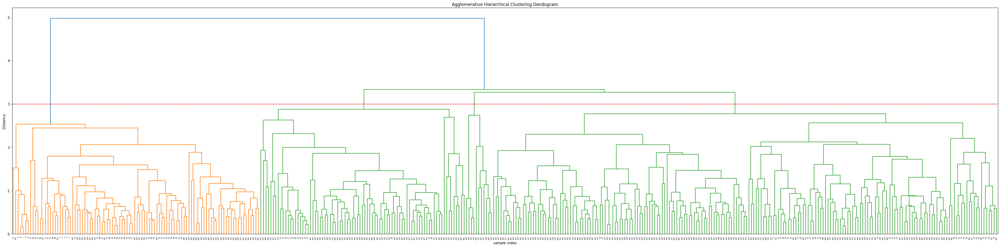

In [122]:
plt.figure(figsize=(40, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90)
plt.tight_layout()
plt.axhline(y=3, color='r', linestyle='--')

Inferences from the above visualizations and data :
- There can't be seen any clear distinction overall between the clusters though each clusters have their own unique features.
- Highest mpg,lowest hp can be seen for cluster 1.
- In case of other attributes other than mpg and hp, cluster 2 is lowest in most.
- Cluster 3 depicts lowest acceleration.
- Cluster 1 denotes average values overall for attributes.

In [123]:
# Scaling

hc_data = data.copy()
hc_data_scaled = data_scaled.copy()

In [124]:
# Model

model = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')

In [125]:
# Fitting the model

model.fit(hc_data_scaled)

AgglomerativeClustering(linkage='average', n_clusters=3)

In [126]:
hc_data = pd.concat([hc_data,one_hot],axis=1)

In [127]:
hc_data.head()

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,0,0
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,0,0
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,0,0
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,0,0
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,0,0


In [128]:
# Adding labels to original data

hc_data['labels'] = model.labels_
hc_data.head(10)

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,18.0,8,307.0,130.0,3504.0,12.0,70,1,0,0,1
1,15.0,8,350.0,165.0,3693.0,11.5,70,1,0,0,1
2,18.0,8,318.0,150.0,3436.0,11.0,70,1,0,0,1
3,16.0,8,304.0,150.0,3433.0,12.0,70,1,0,0,1
4,17.0,8,302.0,140.0,3449.0,10.5,70,1,0,0,1
5,15.0,8,429.0,198.0,4341.0,10.0,70,1,0,0,1
6,14.0,8,454.0,200.0,4354.0,9.0,70,1,0,0,1
7,14.0,8,440.0,200.0,4312.0,8.8,70,1,0,0,1
8,14.0,8,455.0,200.0,4425.0,10.0,70,1,0,0,1
9,15.0,8,390.0,190.0,3850.0,8.8,70,1,0,0,1


In [129]:
# Checking the number of data in each cluster

labels = model.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[215 100  83]


In [130]:
hc_data_scaled_2 = hc_data_scaled.apply(zscore)

In [131]:
# Adding labels to scaled data

hc_data_scaled_2["labels"] = model.labels_

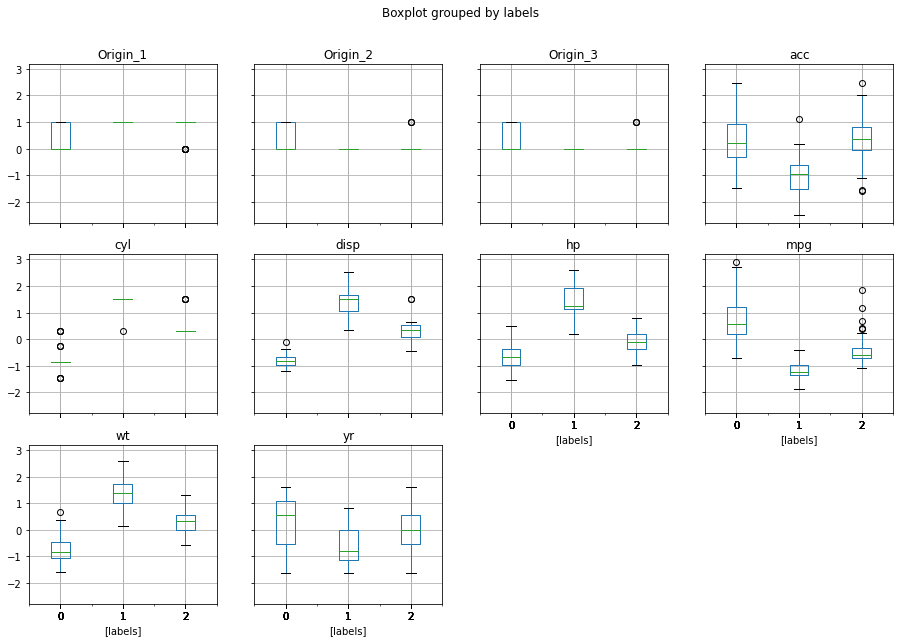

In [132]:
# Visualize the centers

hc_data_scaled["labels"] = model.labels_
hc_data_scaled.boxplot(by = 'labels',  layout=(3,4), figsize=(15, 10));

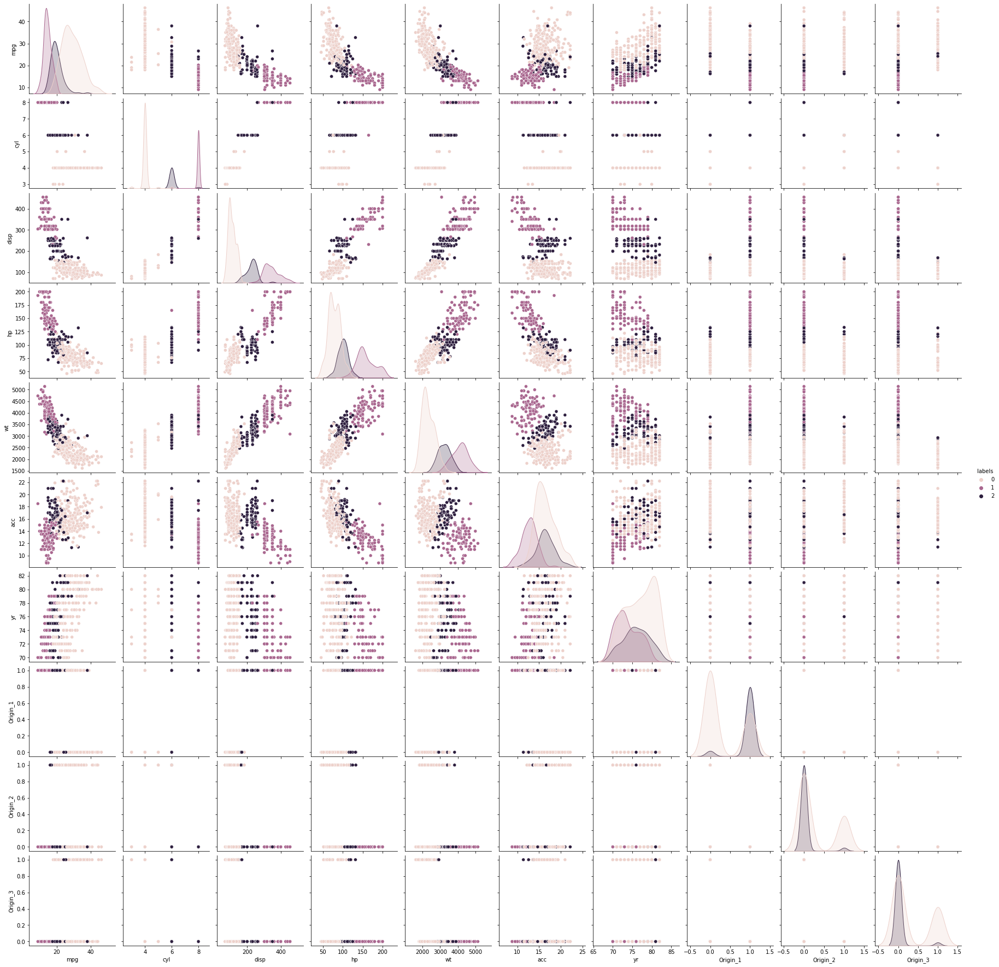

In [133]:
sns.pairplot(hc_data,diag_kind='kde',hue='labels');

In [134]:
hc_data[['mpg', 'disp', 'hp', 'wt','acc','labels','yr','cyl']].groupby('labels').mean()

,mpg,disp,hp,wt,acc,yr,cyl
labels,,,,,,,
0,28.977442,110.355814,78.883721,2332.437209,16.515814,77.065116,4.032558
1,14.684000,345.470000,158.520000,4121.560000,12.716000,73.740000,7.980000
2,19.998795,225.421687,100.650602,3236.132530,16.472289,76.012048,6.096386


Inferences from the above visualizations and data :
- The three clusters 1,2,0 can be visualised as high, average and low performance cars.
- We can also see as performance is high, the mpg is low respectively.
- Cluster 1 has highest value for disp, hp, wt, cyl.
- As cluster 1 represnts heavier cars hence acc is lesser for these when compared to the others.
- Newest cars belong to cluster 0.

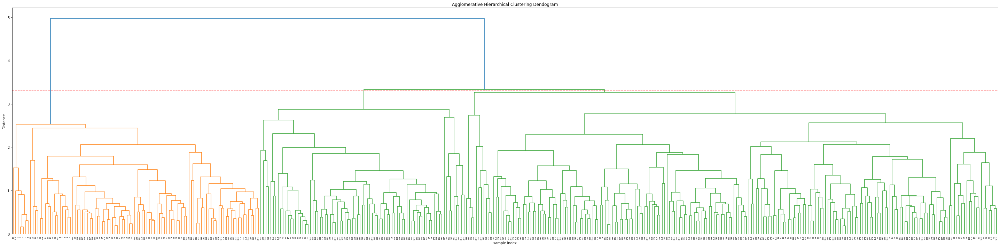

In [135]:
# Plotting with threshold of 3 clusters

plt.figure(figsize=(40, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90)
plt.tight_layout()
plt.axhline(y=3.3, color='r', linestyle='--')

### <center>Share your insights about the difference in using these two methods

- K-means is method of cluster analysis using a pre-specified no. of clusters. It requires advance knowledge of ‘K’. 
- Hierarchical clustering is a method of cluster analysis which seeks to build a hierarchy of clusters without having fixed number of cluster.
- In hierarchical clustering we can stop at any number of clusters, one find appropriate by interpreting the dendrogram.
- In K Means clustering, since we start with random choice of clusters, the results produced by running the algorithm many times may differ.In Hierarchical Clustering, results are reproducible.
- K- means clustering a simply a division of the set of data objects into non-overlapping clusters.A hierarchical clustering is a set of nested clusters that are arranged as a tree.
- K-Value is difficult to predict while hierarchical clustering requires the computation and storage of an n×n  distance matrix. For very large datasets, this can be expensive and slow.

## 5. Answer below questions based on outcomes of using ML based methods:

### <center>Mention how many optimal clusters are present in the data and what could be the possible reason behind it. 

Firstly let's take a plot for each clustering algorithm to show distinction between the clusters

Text(0, 0.5, 'disp')

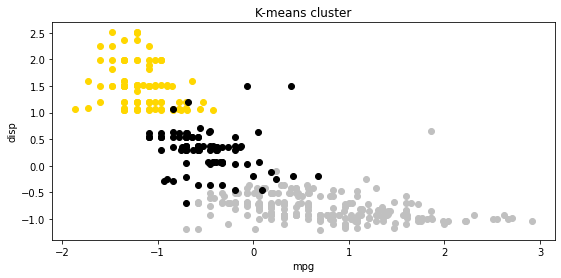

In [136]:
kc1 = kc_data_scaled[kc_data_scaled['labels'] == 0]
kc2 = kc_data_scaled[kc_data_scaled['labels'] == 1]
kc3 = kc_data_scaled[kc_data_scaled['labels'] == 2]
plt.subplots(figsize = ([9,4]))
plt.scatter(kc1['mpg'],kc1['disp'],color = 'gold')
plt.scatter(kc2['mpg'],kc2['disp'],color = 'silver')
plt.scatter(kc3['mpg'],kc3['disp'],color = 'black')
plt.title('K-means cluster')
plt.xlabel('mpg')
plt.ylabel('disp')

Text(0, 0.5, 'disp')

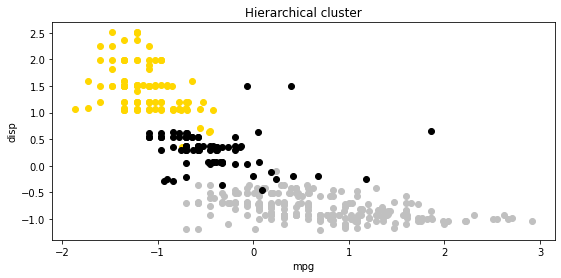

In [137]:
hc1 = hc_data_scaled_2[hc_data_scaled_2['labels'] == 0]
hc2 = hc_data_scaled_2[hc_data_scaled_2['labels'] == 1]
hc3 = hc_data_scaled_2[hc_data_scaled_2['labels'] == 2]
plt.subplots(figsize = ([9,4]))
plt.scatter(hc1['mpg'],hc1['disp'],color = 'silver')
plt.scatter(hc2['mpg'],hc2['disp'],color = 'gold')
plt.scatter(hc3['mpg'],hc3['disp'],color = 'black')
plt.title('Hierarchical cluster')
plt.xlabel('mpg')
plt.ylabel('disp')

- From the above we can see that clusters are well defined and quite distinct.

**After detailed analysis, we can conclude that the optimal number of clusters came out to be 3.**

The reasons for choosing 3 as optimal number of cluster are as follows:
- First insight about the clusters was given to us by the first pair plot shown in the beginning.By seeing the diagonal matrix we could see that there is minimum 3 clusters in our dataset.
- Second while doing K-means clustering the Silhouette Score was highest for 3 clusters.
- Third when comparing the distribution of clusters by Agglomerative (Hierarchical) clustering 3 clusters was more intuitive than 4.
- Fourthly, by seeing graphs just above we can observe the apt distinction between the clusters.

### <center>Use linear regression model on different clusters separately and print the coefficients of the models individually

Let's arrange the data for modelling

<center><b> Using K-means Clustering Clusters</b>

In [138]:
# Whole data

kc_data_scaled_2

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,0.773559,-0.461968,-0.497643,0
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,0.773559,-0.461968,-0.497643,0
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,0.773559,-0.461968,-0.497643,0
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,0.773559,-0.461968,-0.497643,0
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,0.773559,-0.461968,-0.497643,0
...,...,...,...,...,...,...,...,...,...,...,...
393,0.446757,-0.856321,-0.513026,-0.470065,-0.213324,0.017842,1.621983,0.773559,-0.461968,-0.497643,1
394,2.625245,-0.856321,-0.925936,-1.386888,-0.993671,2.471644,1.621983,-1.292726,2.164651,-0.497643,1
395,1.087489,-0.856321,-0.561039,-0.523996,-0.798585,-1.469311,1.621983,0.773559,-0.461968,-0.497643,1
396,0.574904,-0.856321,-0.705077,-0.658823,-0.408411,1.133207,1.621983,0.773559,-0.461968,-0.497643,1


In [139]:
# Cluster 0 

kc1

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,1,0,0,0
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,1,0,0,0
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,1,0,0,0
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,1,0,0,0
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
286,-0.757818,1.498191,1.042591,0.689447,0.892168,-0.800092,0.809631,1,0,0,0
287,-0.898779,1.498191,1.513117,0.932135,1.164107,-0.874449,0.809631,1,0,0,0
289,-0.847521,1.498191,1.503514,1.390547,1.642957,-0.242410,0.809631,1,0,0,0
290,-1.026926,1.498191,1.513117,1.039997,1.281159,-0.465483,0.809631,1,0,0,0


In [140]:
# Cluster 1

kc2

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
14,0.062318,-0.856321,-0.772295,-0.227377,-0.707544,-0.205231,-1.627426,0,0,1,1
18,0.446757,-0.856321,-0.925936,-0.416134,-0.993671,-0.391125,-1.627426,0,0,1,1
19,0.318611,-0.856321,-0.925936,-1.548681,-1.342463,1.839604,-1.627426,0,1,0,1
20,0.190465,-0.856321,-0.801103,-0.443100,-0.352841,0.724240,-1.627426,0,1,0,1
21,0.062318,-0.856321,-0.829911,-0.362203,-0.638968,-0.391125,-1.627426,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...
393,0.446757,-0.856321,-0.513026,-0.470065,-0.213324,0.017842,1.621983,1,0,0,1
394,2.625245,-0.856321,-0.925936,-1.386888,-0.993671,2.471644,1.621983,0,1,0,1
395,1.087489,-0.856321,-0.561039,-0.523996,-0.798585,-1.469311,1.621983,1,0,0,1
396,0.574904,-0.856321,-0.705077,-0.658823,-0.408411,1.133207,1.621983,1,0,0,1


In [141]:
# Cluster 2

kc3

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
15,-0.193974,0.320935,0.043923,-0.227377,-0.162483,-0.019337,-1.627426,1,0,0,2
16,-0.706560,0.320935,0.053526,-0.173446,-0.232242,-0.019337,-1.627426,1,0,0,2
17,-0.322121,0.320935,0.063128,-0.497030,-0.453340,0.166557,-1.627426,1,0,0,2
24,-0.322121,0.320935,0.053526,-0.362203,-0.381217,-0.205231,-1.627426,1,0,0,2
33,-0.578413,0.320935,0.370411,-0.092550,-0.397770,-0.948807,-1.356642,1,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...
364,0.395499,1.498191,1.503514,0.042277,0.892168,1.281922,1.351199,1,0,0,2
365,-0.424638,0.320935,0.063128,-0.416134,0.105909,0.575524,1.351199,1,0,0,2
366,-0.757818,0.320935,0.303193,-0.497030,0.584758,0.389630,1.351199,1,0,0,2
386,0.190465,0.320935,-0.119320,0.177104,-0.030061,0.315273,1.621983,1,0,0,2


In [142]:
kc_data_final = hc_data.apply(zscore)

In [143]:
y1 = kc1['mpg']
y2 = kc2['mpg']
y3 = kc3['mpg']
y_whole = kc_data_final['mpg']

In [144]:
x1 = kc1.drop(['mpg','labels'],axis=1)
x2 = kc2.drop(['mpg','labels'],axis=1)
x3 = kc3.drop(['mpg','labels'],axis=1)
x_whole = kc_data_final.drop(['mpg','labels'],axis=1)

<u>Linear Regression on Cluster 0</u>

In [145]:
train_x,test_x,train_y,test_y = train_test_split(x1,y1, random_state = 101,test_size=0.50)

In [146]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [147]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.11750743889426662


In [148]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.16458942353803793


In [149]:
lr.coef_

array([-0.04529792, -0.11054806, -0.14268954, -0.03048727, -0.23487082,
        0.1716613 ,  0.        ,  0.        ,  0.        ])

In [150]:
lr.score(train_x, train_y)

0.5898744200972221

In [151]:
lr.score(test_x,test_y)

0.4828866402573889

Text(0.5, 1.0, 'Coefficient plot')

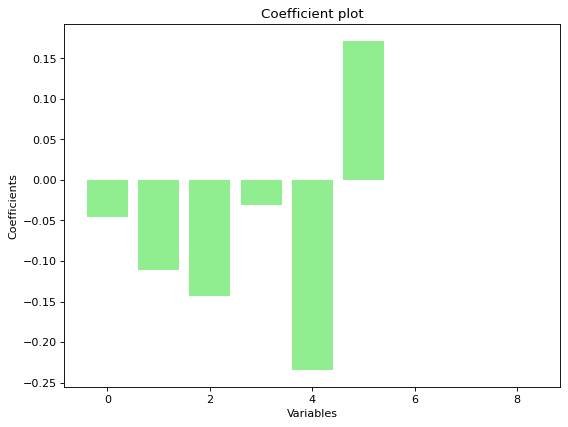

In [152]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'lightgreen' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

<u>Linear Regression on Cluster 1</u>

In [153]:
train_x,test_x,train_y,test_y = train_test_split(x2,y2, random_state = 101)

In [154]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [155]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.2891111834582922


In [156]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.3394412684649525


In [157]:
lr.coef_

array([ 1.02846076, -0.02549954, -0.28491346, -0.8844895 , -0.01032612,
        0.40146791, -0.12923385,  0.05033023,  0.07890362])

In [158]:
lr.score(train_x, train_y)

0.7215838642832085

In [159]:
lr.score(test_x,test_y)

0.6509307009917924

Text(0.5, 1.0, 'Coefficient plot')

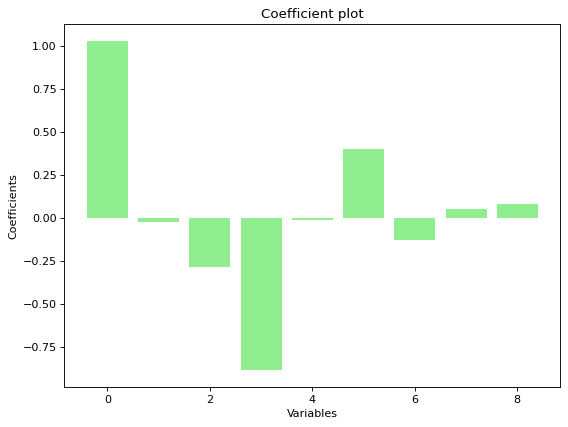

In [160]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'lightgreen' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

<u>Linear Regression on Cluster 2</u>

In [161]:
train_x,test_x,train_y,test_y = train_test_split(x3,y3, random_state = 101)

In [162]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [163]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.1767418648920535


In [164]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.2224596719204656


In [165]:
lr.coef_

array([ 0.24686848, -0.21137816, -0.10958224, -0.30283073, -0.1210553 ,
        0.20623771,  0.18528032, -0.23570625,  0.05042594])

In [166]:
lr.score(train_x, train_y)

0.585609455975685

In [167]:
lr.score(test_x,test_y)

0.3712849639548601

Text(0.5, 1.0, 'Coefficient plot')

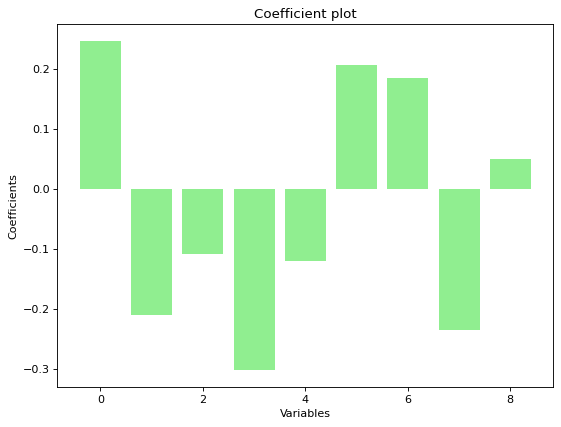

In [168]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'lightgreen' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

<u>Linear Regression on whole data</u>

In [169]:
train_x,test_x,train_y,test_y = train_test_split(x_whole,y_whole, random_state = 101)

In [170]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [171]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.31513150903571624


In [172]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.3496642821712211


In [173]:
lr.coef_

array([-0.1253567 ,  0.36554334, -0.14842587, -0.72285682, -0.01799169,
        0.38129835, -0.08465435,  0.05427656,  0.05090774])

In [174]:
lr.score(train_x, train_y)

0.8305712978307176

In [175]:
lr.score(test_x,test_y)

0.8035570977015722

Text(0.5, 1.0, 'Coefficient plot')

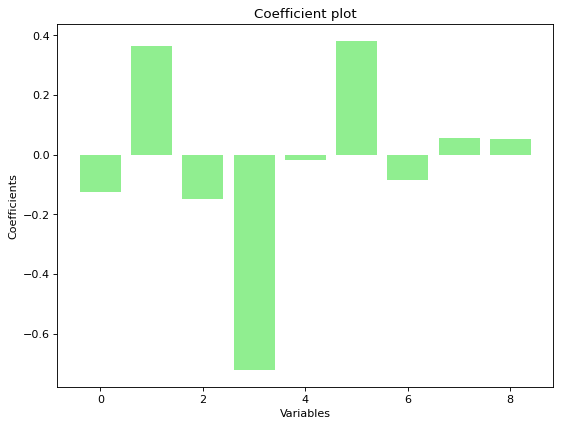

In [176]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'lightgreen' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

Joining the two clusters and feeding to Linear Regression model (as with less data points there is an issue of Curse of Dimensionality) to check for any improvements.Also the reason they can merged is that, they are not extremes.

In [177]:
x_1_3 = pd.concat([x3,x1])

In [178]:
y_1_3 = pd.concat([y3,y1])

In [179]:
train_x,test_x,train_y,test_y = train_test_split(x_1_3,y_1_3, random_state = 101,test_size=0.3)

In [180]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [181]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.15781600931011472


In [182]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.19515483383584423


In [183]:
lr.coef_

array([-0.07305521,  0.04701396, -0.10460953, -0.3608351 , -0.08876367,
        0.20300785,  0.11580607, -0.30448353,  0.18867745])

In [184]:
lr.score(train_x, train_y)

0.7667879860209728

In [185]:
lr.score(test_x,test_y)

0.6408858296386291

Our assumption worked and we can see improvement in performance.

<center><b>Using Hierarchical Clustering Clusters</b>

In [186]:
# Whole data

hc_data_scaled_2

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,0.773559,-0.461968,-0.497643,1
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,0.773559,-0.461968,-0.497643,1
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,0.773559,-0.461968,-0.497643,1
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,0.773559,-0.461968,-0.497643,1
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,0.773559,-0.461968,-0.497643,1
...,...,...,...,...,...,...,...,...,...,...,...
393,0.446757,-0.856321,-0.513026,-0.470065,-0.213324,0.017842,1.621983,0.773559,-0.461968,-0.497643,0
394,2.625245,-0.856321,-0.925936,-1.386888,-0.993671,2.471644,1.621983,-1.292726,2.164651,-0.497643,0
395,1.087489,-0.856321,-0.561039,-0.523996,-0.798585,-1.469311,1.621983,0.773559,-0.461968,-0.497643,0
396,0.574904,-0.856321,-0.705077,-0.658823,-0.408411,1.133207,1.621983,0.773559,-0.461968,-0.497643,0


In [187]:
# Cluster 0

hc1

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
14,0.062318,-0.856321,-0.772295,-0.227377,-0.707544,-0.205231,-1.627426,-1.292726,-0.461968,2.009471,0
18,0.446757,-0.856321,-0.925936,-0.416134,-0.993671,-0.391125,-1.627426,-1.292726,-0.461968,2.009471,0
19,0.318611,-0.856321,-0.925936,-1.548681,-1.342463,1.839604,-1.627426,-1.292726,2.164651,-0.497643,0
20,0.190465,-0.856321,-0.801103,-0.443100,-0.352841,0.724240,-1.627426,-1.292726,2.164651,-0.497643,0
21,0.062318,-0.856321,-0.829911,-0.362203,-0.638968,-0.391125,-1.627426,-1.292726,2.164651,-0.497643,0
...,...,...,...,...,...,...,...,...,...,...,...
393,0.446757,-0.856321,-0.513026,-0.470065,-0.213324,0.017842,1.621983,0.773559,-0.461968,-0.497643,0
394,2.625245,-0.856321,-0.925936,-1.386888,-0.993671,2.471644,1.621983,-1.292726,2.164651,-0.497643,0
395,1.087489,-0.856321,-0.561039,-0.523996,-0.798585,-1.469311,1.621983,0.773559,-0.461968,-0.497643,0
396,0.574904,-0.856321,-0.705077,-0.658823,-0.408411,1.133207,1.621983,0.773559,-0.461968,-0.497643,0


In [188]:
# Cluster 1

hc2

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
0,-0.706560,1.498191,1.090604,0.716412,0.630870,-1.320595,-1.627426,0.773559,-0.461968,-0.497643,1
1,-1.090999,1.498191,1.503514,1.660201,0.854333,-1.506489,-1.627426,0.773559,-0.461968,-0.497643,1
2,-0.706560,1.498191,1.196232,1.255720,0.550470,-1.692383,-1.627426,0.773559,-0.461968,-0.497643,1
3,-0.962852,1.498191,1.061796,1.255720,0.546923,-1.320595,-1.627426,0.773559,-0.461968,-0.497643,1
4,-0.834706,1.498191,1.042591,0.986066,0.565841,-1.878278,-1.627426,0.773559,-0.461968,-0.497643,1
...,...,...,...,...,...,...,...,...,...,...,...
288,-0.680930,1.498191,1.196232,0.851239,1.016314,-0.130873,0.809631,0.773559,-0.461968,-0.497643,1
289,-0.847521,1.498191,1.503514,1.390547,1.642957,-0.242410,0.809631,0.773559,-0.461968,-0.497643,1
290,-1.026926,1.498191,1.513117,1.039997,1.281159,-0.465483,0.809631,0.773559,-0.461968,-0.497643,1
291,-0.552784,1.498191,0.706501,0.581585,0.750287,-0.205231,0.809631,0.773559,-0.461968,-0.497643,1


In [189]:
# Cluster 2

hc3

,mpg,cyl,disp,hp,wt,acc,yr,Origin_1,Origin_2,Origin_3,labels
15,-0.193974,0.320935,0.043923,-0.227377,-0.162483,-0.019337,-1.627426,0.773559,-0.461968,-0.497643,2
16,-0.706560,0.320935,0.053526,-0.173446,-0.232242,-0.019337,-1.627426,0.773559,-0.461968,-0.497643,2
17,-0.322121,0.320935,0.063128,-0.497030,-0.453340,0.166557,-1.627426,0.773559,-0.461968,-0.497643,2
24,-0.322121,0.320935,0.053526,-0.362203,-0.381217,-0.205231,-1.627426,0.773559,-0.461968,-0.497643,2
33,-0.578413,0.320935,0.370411,-0.092550,-0.397770,-0.948807,-1.356642,0.773559,-0.461968,-0.497643,2
...,...,...,...,...,...,...,...,...,...,...,...
365,-0.424638,0.320935,0.063128,-0.416134,0.105909,0.575524,1.351199,0.773559,-0.461968,-0.497643,2
366,-0.757818,0.320935,0.303193,-0.497030,0.584758,0.389630,1.351199,0.773559,-0.461968,-0.497643,2
386,0.190465,0.320935,-0.119320,0.177104,-0.030061,0.315273,1.621983,0.773559,-0.461968,-0.497643,2
387,1.856367,0.320935,0.658488,-0.497030,0.052703,0.538346,1.621983,0.773559,-0.461968,-0.497643,2


In [190]:
hc_data_final = hc_data.apply(zscore)

In [191]:
y1 = hc1['mpg']
y2 = hc2['mpg']
y3 = hc3['mpg']
y_whole = hc_data_final['mpg']

In [192]:
x1 = hc1.drop(['mpg','labels'],axis=1)
x2 = hc2.drop(['mpg','labels'],axis=1)
x3 = hc3.drop(['mpg','labels'],axis=1)
x_whole = hc_data_final.drop(['mpg','labels'],axis=1)

<u>Linear Regression on Cluster 0</u>

In [193]:
train_x,test_x,train_y,test_y = train_test_split(x1,y1, random_state = 101,test_size=0.50)

In [194]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [195]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.2949628075026408


In [196]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.3257683031092633


In [197]:
lr.coef_

array([ 0.42452718, -0.21273875, -0.27935435, -0.82094414, -0.03008641,
        0.40939072, -0.03961427,  0.02595679,  0.02328992])

In [198]:
lr.score(train_x, train_y)

0.7026500832792153

In [199]:
lr.score(test_x,test_y)

0.6910755537886417

Text(0.5, 1.0, 'Coefficient plot')

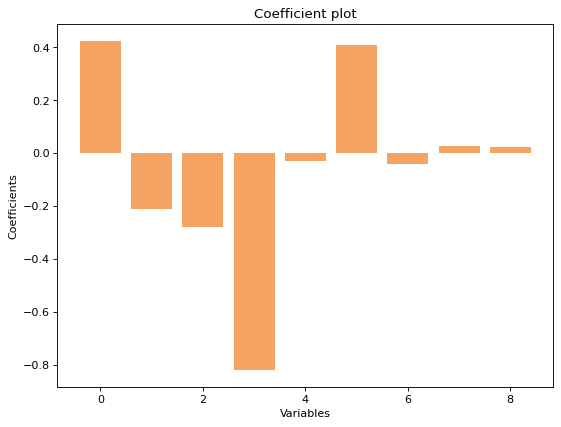

In [200]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'sandybrown' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

<u>Linear Regression on Cluster 1</u>

In [201]:
train_x,test_x,train_y,test_y = train_test_split(x2,y2, random_state = 101)

In [202]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [203]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.1364860223628592


In [204]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.16113023889809233


In [205]:
lr.coef_

array([-0.15329898, -0.04086793, -0.11949761, -0.13585495, -0.16686493,
        0.21156152,  0.        , -0.03832474,  0.03832474])

In [206]:
lr.score(train_x, train_y)

0.6640298170033914

In [207]:
lr.score(test_x,test_y)

0.40932019295348343

Text(0.5, 1.0, 'Coefficient plot')

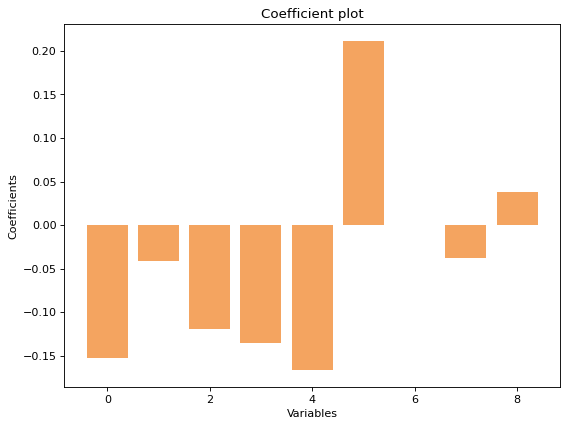

In [208]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'sandybrown' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

<u>Linear Regression on Cluster 2</u>

In [209]:
train_x,test_x,train_y,test_y = train_test_split(x3,y3, random_state = 101)

In [210]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [211]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.22233734921389822


In [212]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.2809288581235854


In [213]:
lr.coef_

array([ 0.28178401,  0.38691526, -0.13219354, -0.54248674, -0.1854365 ,
        0.30338402, -0.04305985, -0.16361371,  0.20841609])

In [214]:
lr.score(train_x, train_y)

0.5835793924677604

In [215]:
lr.score(test_x,test_y)

0.3467351176494792

Text(0.5, 1.0, 'Coefficient plot')

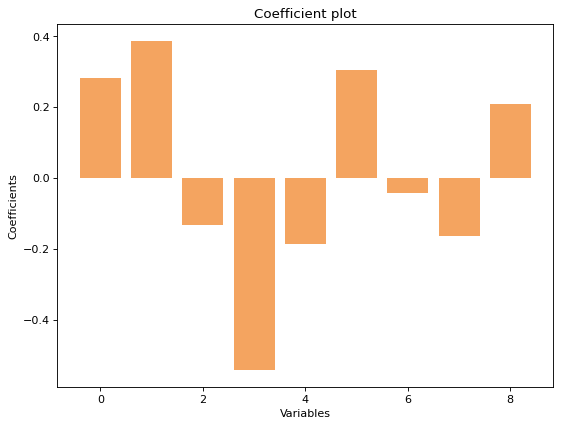

In [216]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'sandybrown' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

<u>Linear Regression on Whole Data</u>

In [217]:
train_x,test_x,train_y,test_y = train_test_split(x_whole,y_whole, random_state = 101)

In [218]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [219]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.31513150903571624


In [220]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.3496642821712211


In [221]:
lr.coef_

array([-0.1253567 ,  0.36554334, -0.14842587, -0.72285682, -0.01799169,
        0.38129835, -0.08465435,  0.05427656,  0.05090774])

In [222]:
lr.score(train_x, train_y)

0.8305712978307176

In [223]:
lr.score(test_x,test_y)

0.8035570977015722

Text(0.5, 1.0, 'Coefficient plot')

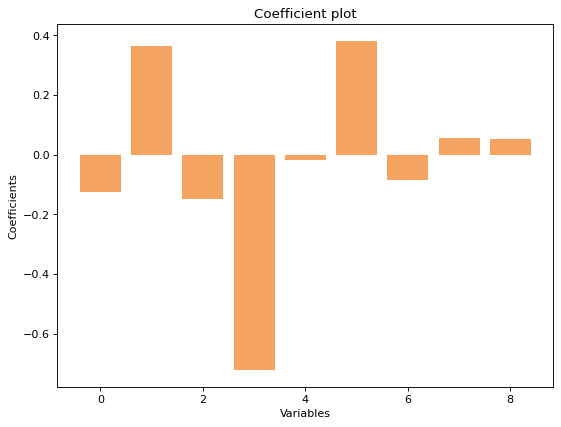

In [224]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='b')
x = range(len(train_x.columns))
y = lr.coef_
plt.bar( x, y, color = 'sandybrown' )
plt.xlabel( "Variables")
plt.ylabel('Coefficients')
plt.title('Coefficient plot')

Joining the two clusters and feeding to Linear Regression model (as with less data points there is an issue of Curse of Dimensionality) to check for any improvements.Also the reason they can merged is that, they are not extremes.

In [225]:
x_2_3 = pd.concat([x3,x2])

In [226]:
y_2_3 = pd.concat([y3,y2])

In [227]:
train_x,test_x,train_y,test_y = train_test_split(x_2_3,y_2_3, random_state = 101,test_size=0.3)

In [228]:
# Creating instance of Linear Regresssion
lr = LR()

# Fitting the model
lr.fit(train_x, train_y)

LinearRegression()

In [229]:
# Predicting over the Train Set and calculating error
train_predict = lr.predict(train_x)
k = mae(train_predict, train_y)
print('Training Mean Absolute Error', k )

Training Mean Absolute Error 0.19395570999990866


In [230]:
# Predicting over the Test Set and calculating error
test_predict = lr.predict(test_x)
k = mae(test_predict, test_y)
print('Test Mean Absolute Error', k )

Test Mean Absolute Error 0.18652387634132858


In [231]:
lr.coef_

array([-0.02443852,  0.0725652 , -0.18190489, -0.34377619, -0.08214246,
        0.24159397, -0.08190928, -0.13585443,  0.22905752])

In [232]:
lr.score(train_x, train_y)

0.7118740809982089

In [233]:
lr.score(test_x,test_y)

0.6876665135014226

Our assumption worked and we can see improvement in performance.

### <center>How  using  different  models  for  different  clusters  will  be  helpful  in  this  case  and  how  it  will  be  different  than  using  one  single  model  without clustering? Mention how it impacts performance and prediction

Following inferences can be made :
- When we split our original dataset into multiple clusters, each cluster represented values which made sense out of the whole set.
- We split our data into three clusters.
- The clusters represented Low, Average and High performance cars as was observered from respective features and was quite intuitive.
- We got clusters which were quite distinct and same was seen from the data and visulaisations before.
- After clustering, we decided to feed data of each cluster to separate linear regression model.
- We also fed the whole data to a single model.
- We saw reduction in performance after clustering.
- One rule of thumb is ten observations for each independent variable. That’s reasonable. But we may need more if our independent variables are not orthogonal.
- Owing to this reason our model performance was less for clusters by the curse of dimensionality.
- This can be confirmed as when we combined Low and Average clusters together and fed to a seperate model our performance improved substantially.
- Still, we have better performance of model with whole dataset rather than clustered ones.


## 6. Improvisation: 

### <center>Detailed  suggestions  or  improvements  or  on  quality,  quantity,  variety,  velocity,  veracity  etc.  on  the  data  points  collected  by  the  company to perform a better data analysis in future

Following suggestions can be taken into account :
- We can have more datapoints as after clustering we face the curse of dimensionality.
- We can have lots of new features which would help explain the variance in the target variable even better.
- We can include the class of the vehicle like Sedan, SUV, Hatchback etc
- We can have capacity of the vehicle as a parameter.
- Price of the car can be included as generally luxury cars focus more on performance while economical cars are focussed more on mileage.
- Drive type like 2WD, 4WD, FWD and RWD can be included as its say a lot about its classification.
- Along with model year, we should also have the age of the vehicle as it greatly impacts the mielage.
- Transmission type like Auto, Semi-Auto and Manual can be added. 
- Fuel category can be an important category beacuse mileage changes whether the car runs on petrol or diesel.


# <center>USL-Project Part Two

## 1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

In [234]:
# Importing the libraries

# Basic
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from collections import Counter

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score


In [235]:
# Importing the datasets by reading the appropriate CSV files

Data = pd.read_excel('Part2 - Company.xlsx')

In [236]:
# Checking the shape of the imported datasets

print('The data set shape:',Data.shape)

The data set shape: (61, 5)


In [237]:
# Checking the information of the imported datasets

print(Data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB
None


In [238]:
# Let's first create a copy of our main dataset

data = Data.copy()

In [239]:
# Observing the dataset 'data_merged'
# First and last 5 rows displayed

data

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A
...,...,...,...,...,...
56,200,186,185,179,Quality B
57,137,182,165,199,NaN
58,88,39,9,102,NaN
59,180,157,192,198,NaN


In [240]:
# Let's observe the values which might give us some more insights on automation task given

data.describe(include='all')

,A,B,C,D,Quality
count,61.000000,61.000000,61.000000,61.000000,43
unique,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,Quality A
freq,NaN,NaN,NaN,NaN,26
mean,118.557377,116.639344,114.081967,114.459016,NaN
std,61.771494,57.897908,65.615368,63.144431,NaN
min,3.000000,5.000000,3.000000,3.000000,NaN
25%,61.000000,63.000000,59.000000,51.000000,NaN
50%,136.000000,138.000000,135.000000,132.000000,NaN
75%,171.000000,168.000000,174.000000,174.000000,NaN


- Each variable 3 to 300

In [241]:
# Checking for null values

data.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

- MV only for Quality

In [242]:
# Identifying duplicate records in the data

dupes = data.duplicated()
sum(dupes)

0

In [243]:
# Now let's look at the categorical column 'class'

data['Quality']

0     Quality A
1     Quality B
2           NaN
3     Quality A
4     Quality A
        ...    
56    Quality B
57          NaN
58          NaN
59          NaN
60          NaN
Name: Quality, Length: 61, dtype: object

In [244]:
# Checking unique value and their counts for 'Class' column

data['Quality'].value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

Rest 18 are missing values

In [245]:
data.groupby('Quality').mean()

,A,B,C,D
Quality,,,,
Quality A,58.769231,62.230769,53.000000,51.807692
Quality B,167.176471,168.470588,173.470588,165.411765


Quality A has lower values for features and vice-versa

In [246]:
# Independent variables and Target

X = data.drop('Quality',axis=1)
y = data['Quality']

In [247]:
# Scaling

X_scaled = X.apply(zscore)

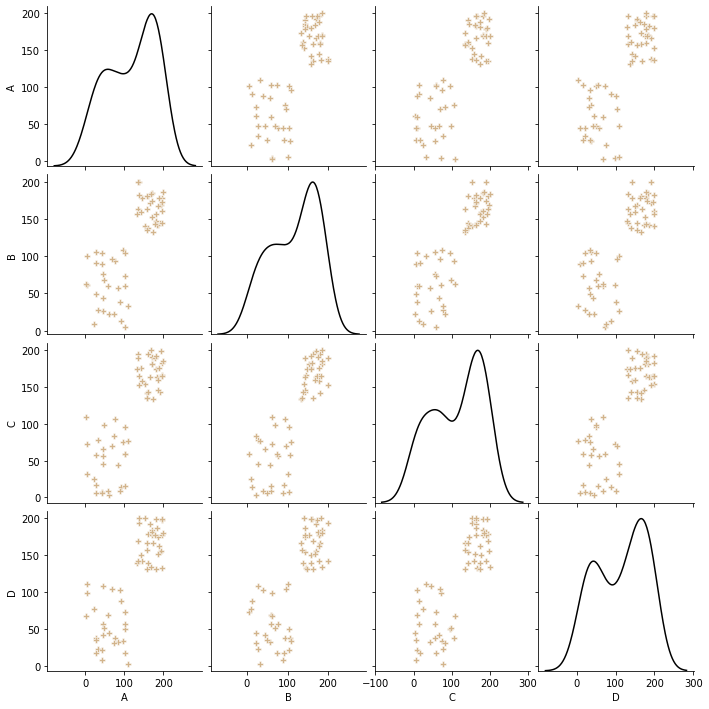

In [248]:
# Pair plot on strength relationship
# Pair plot to get an rough estimation on clusters

sns.pairplot(X,diag_kind='kde',plot_kws=dict(marker="P", linewidth=0.5,color='tan'),diag_kws=dict(fill=False,color='black'));

From diagonals, we can see that minimum 2 clusters are evident.

In [249]:
# Creating multiple clusters to choose the optimum

cluster_range = range(1,5)
cluster_errors = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 5)
    clusters.fit(X_scaled)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)

clusters_df = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": cluster_errors})
clusters_df

,num_clusters,cluster_errors
0,1,244.000000
1,2,45.522552
2,3,37.604047
3,4,32.466903


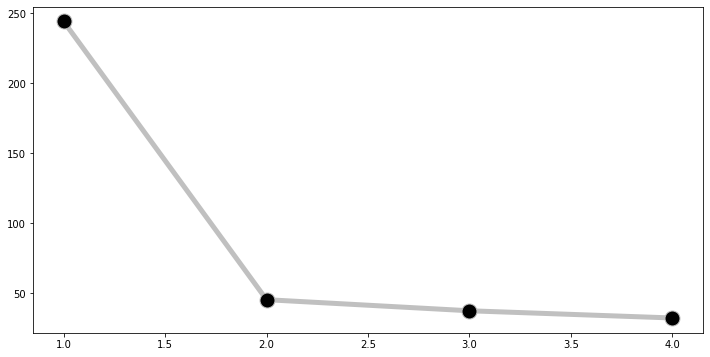

In [250]:
# Elbow plot to determine the right number of clusters

plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" ,color = 'silver',markerfacecolor='black', markersize=15,linewidth=5);

We have a clear cut elbow and hence we will choose 2 clusters.

In [251]:
# K-means clustering with 2 clusters

k_means = KMeans(n_clusters = 2)
k_means.fit(X_scaled)
labels = k_means.labels_

In [252]:
# Calculating silhouette_score

silhouette_score(X_scaled,labels)

0.6891674125195145

In [253]:
# Assigning the labels to the original data

data['Labels'] = labels

In [254]:
# Randomly checking data multiple times for analysis

data.sample(10)

,A,B,C,D,Quality,Labels
28,85,58,44,32,Quality A,1
15,196,145,166,132,Quality B,0
7,191,144,143,154,NaN,0
18,167,171,163,191,NaN,0
52,188,178,175,162,NaN,0
56,200,186,185,179,Quality B,0
29,29,49,6,35,NaN,1
9,145,178,158,141,NaN,0
17,96,109,75,34,Quality A,1
26,170,153,181,176,Quality B,0


After assigning the labels we can see that Quality B corresponds to 0 and Quality A corresponds to 1. Same can be demonstrated below.

In [255]:
data_check = data[['Quality','Labels']]

In [256]:
data_check

,Quality,Labels
0,Quality A,1
1,Quality B,0
2,NaN,0
3,Quality A,1
4,Quality A,1
...,...,...
56,Quality B,0
57,NaN,0
58,NaN,1
59,NaN,0


In [257]:
data_check.dropna(inplace=True)

In [258]:
data_check

,Quality,Labels
0,Quality A,1
1,Quality B,0
3,Quality A,1
4,Quality A,1
6,Quality A,1
8,Quality B,0
10,Quality A,1
11,Quality B,0
12,Quality A,1
13,Quality A,1


In [259]:
data_check['Quality'].value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

In [260]:
data_check['Labels'].value_counts()

1    26
0    17
Name: Labels, dtype: int64

We can confirm our assumption now.

In [261]:
data['Labels'].replace({ 1 : 'Quality A', 0 : 'Quality B' })

0     Quality A
1     Quality B
2     Quality B
3     Quality A
4     Quality A
        ...    
56    Quality B
57    Quality B
58    Quality A
59    Quality B
60    Quality B
Name: Labels, Length: 61, dtype: object

In [262]:
data.drop('Quality',axis=1, inplace=True)

In [263]:
data.rename(columns = {'Labels':'Quality'}, inplace = True)

In [264]:
data.isna().sum()

A          0
B          0
C          0
D          0
Quality    0
dtype: int64

In [265]:
data

,A,B,C,D,Quality
0,47,27,45,108,1
1,174,133,134,166,0
2,159,163,135,131,0
3,61,23,3,44,1
4,59,60,9,68,1
...,...,...,...,...,...
56,200,186,185,179,0
57,137,182,165,199,0
58,88,39,9,102,1
59,180,157,192,198,0


In [266]:
data['Quality'] = data['Quality'].replace({ 1 : 'Quality A', 0 : 'Quality B' })

In [267]:
data

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,Quality B
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A
...,...,...,...,...,...
56,200,186,185,179,Quality B
57,137,182,165,199,Quality B
58,88,39,9,102,Quality A
59,180,157,192,198,Quality B


Here, we can see that the missing values have finally been imputed appropriately.

# <center>USL-Project Part Three

In [268]:
# Importing the libraries

# Basic
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from collections import Counter

# Model
from sklearn.svm import SVC

# Dimensionality Reduction
from sklearn.decomposition import PCA


## 1. Data: Import, clean and pre-process the data

- Please note that pre-processing will be done after analysis

In [269]:
# Importing the datasets by reading the appropriate CSV files

Data = pd.read_csv('Part3 - vehicle.csv')

In [270]:
# Checking the shape of the imported datasets

print('The data set shape:',Data.shape)


The data set shape: (846, 19)


In [271]:
# Checking the information of the imported datasets

print(Data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [272]:
# Let's first create a copy of our main dataset

data = Data.copy()

In [273]:
# Observing the dataset 'data_merged'
# First and last 5 rows displayed

data

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car


In [274]:
# Let's observe the values which might give us some more insights

data.describe(include='all')

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000,846
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,car
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,429
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388,NaN
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797,NaN
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000,NaN
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000,NaN
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000,NaN
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000,NaN


In [275]:
# Checking for null values

data.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [276]:
# Imputing the null values

for i in data.columns:
    if(i != 'class'): 
        data[i] = data[i].fillna(data[i].median())

In [277]:
# Checking again for null values

data.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [278]:
# Identifying duplicate records in the data

dupes = data.duplicated()
sum(dupes)

0

In [279]:
# Let's look at random samples
# Run the code multiple times to check

data.sample(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
131,86,36.0,77.0,165.0,60.0,7,150.0,45.0,19.0,128,174.0,331.0,131.0,66.0,0.0,32.0,196.0,203,car
724,94,45.0,85.0,160.0,63.0,10,158.0,43.0,20.0,157,174.0,367.0,162.0,68.0,1.0,6.0,189.0,199,van
441,90,47.0,73.0,136.0,58.0,11,161.0,42.0,20.0,153,172.0,376.0,185.0,77.0,11.0,8.0,183.0,191,van
578,92,46.0,82.0,170.0,58.0,8,165.0,40.0,20.0,149,181.0,409.0,164.0,61.0,8.0,11.0,200.0,208,car
733,114,57.0,102.0,181.0,52.0,6,257.0,26.0,28.0,169,287.0,968.0,261.0,85.0,2.0,21.0,182.0,184,bus
748,93,46.0,85.0,169.0,66.0,9,151.0,44.0,19.0,147,169.0,339.0,179.0,67.0,0.0,4.0,195.0,204,van
690,94,40.0,85.0,186.0,62.0,9,169.0,39.0,20.0,139,184.0,430.0,133.0,61.0,2.0,9.0,200.0,210,car
24,99,53.0,105.0,219.0,66.0,11,204.0,32.0,23.0,165,221.0,623.0,224.0,68.0,0.0,6.0,191.0,201,car
522,89,36.0,69.0,162.0,63.0,6,140.0,48.0,18.0,131,179.0,291.0,126.0,66.0,1.0,38.0,193.0,204,car
756,95,53.0,95.0,202.0,65.0,10,193.0,34.0,22.0,160,220.0,559.0,237.0,71.0,3.0,2.0,188.0,196,car


In [280]:
# Now let's look at the categorical column 'class'

data['class']

0      van
1      van
2      car
3      van
4      bus
      ... 
841    car
842    van
843    car
844    car
845    van
Name: class, Length: 846, dtype: object

In [281]:
# Checking unique value and their counts for 'Class' column

data['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

-  We can see that class is not balanced

## 2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods. 

In [282]:
# Filtering numerical columns 

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = data.select_dtypes(include=numerics).columns.to_list()

In [283]:
# Function for numeric's analysis of each column passed as a list
# Min, Max, Range, Mean, Median, Standard Deviation, Skewness, Kurtosis

def uva_num(data, data_group):
  
  ''' 
  Univariate Analysis for Numeric:
  takes a group of variables (INTEGER and FLOAT) and plots all the descriptives and properties along with KDE.\n
  
  data : dataframe from which to plot from\n
  
  data_group : {list} type Group of Continuous variables\n

  '''  

  
  size = len(data_group)
  plt.figure(figsize = (8*size,3), dpi = 100)
  
  # Looping for each variable

  for j,i in enumerate(data_group):
    
    # Calculating descriptives of variable
    
    mini = data[i].min()
    maxi = data[i].max()
    ran = data[i].max()-data[i].min()
    mean = data[i].mean()
    median = data[i].median()
    st_dev = data[i].std()
    skew = data[i].skew()
    kurt = data[i].kurtosis()
    
    # Calculating points of standard deviation
    
    points = mean-st_dev, mean+st_dev
    
    # Plotting with every information
    
    plt.subplot(1,size,j+1)
    sns.kdeplot(data[i], shade=True, color='aqua',)
    sns.lineplot(points, [0,0], color = 'yellow', label = "std_dev",linewidth = 2.5)
    sns.scatterplot([mini,maxi], [0,0], color = 'orange', label = "min/max")
    sns.scatterplot([mean], [0], color = 'red', label = "mean")
    sns.scatterplot([median], [0], color = 'blue', label = "median")
    plt.xlabel('{}'.format(i))
    plt.ylabel('density')
    plt.title('std_dev = {}; kurtosis = {};\nskew = {}; range = {}\nmean = {}; median = {}'.format((round(points[0],2),
                                                                                                    round(points[1],2)),
                                                                                                    round(kurt,2),
                                                                                                    round(skew,2),
                                                                                                    (round(mini,2),round(maxi,2),round(ran,2)),
                                                                                                    round(mean,2),
                                                                                                    round(median,2)))

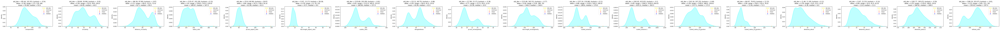

In [284]:
uva_num(data,num_cols)

- We can observe from the above that most of the distributions are slightly/moderately and positvely/negatively skewed.
- Most of them have kurtosis close to a normal distribution.
- Few of them have high kurtosis associated along with high skewness which includes pr.axis_aspect_ratio, max.length_aspect_ratio2 and scale_radius_of_gyration.1 representing leptokurtic distribution.
- We can also see prescence of outliers which we will confirm shortly.
- Rest statistical parameters are observed accordingly.

In [285]:
# custom function for outlier analysis

def uva_outlier(data, data_group, include_outlier = True):
  
  '''
  Univariate Analysis for Outlier:
  takes a group of variables (INTEGER and FLOAT) and plot boxplot and descriptives\n
  
  data : dataframe from which to plot from\n
  
  data_group : {list} type Group of Continuous variables\n
  
  include_outlier : {bool} whether to include outliers or not, default = True\n
  '''

  size = len(data_group)
  plt.figure(figsize = (7*size,4), dpi = 100)
  
  # Looping for each variable
  
  for j,i in enumerate(data_group):
    
    # Calculating the descriptives
    
    quant25 = data[i].quantile(0.25)
    quant75 = data[i].quantile(0.75)
    IQR = quant75 - quant25
    med = data[i].median()
    whis_low = med-(1.5*IQR)
    whis_high = med+(1.5*IQR)

    # Calculating number of outliers
    outlier_high = len(data[i][data[i]>whis_high])
    outlier_low = len(data[i][data[i]<whis_low])

    if include_outlier == True:
      
      # Plotting with every information
      
      plt.subplot(1,size,j+1)
      sns.boxplot(data[i], orient="v",palette='gray')
      plt.ylabel('{}'.format(i))
      plt.title('With Outliers\nIQR = {}; Median = {} \n 2nd,3rd  quartile = {};\n Outlier (low/high) = {} \n'.format(
                                                                                                   round(IQR,2),
                                                                                                   round(med,2),
                                                                                                   (round(quant25,2),round(quant75,2)),
                                                                                                   (outlier_low,outlier_high)
                                                                                                   ))
      
    else:
      
      # Replacing outliers with max/min whisker
      
      data2 = data[data_group][:]
      data2[i][data2[i]>whis_high] = whis_high+1
      data2[i][data2[i]<whis_low] = whis_low-1
      
      # Plotting without outliers
        
      plt.subplot(1,size,j+1)
      sns.boxplot(data2[i], orient="v",color='silver')
      plt.ylabel('{}'.format(i))
      plt.title('Without Outliers\nIQR = {}; Median = {} \n 2nd,3rd  quartile = {};\n Outlier (low/high) = {} \n'.format(
                                                                                                   round(IQR,2),
                                                                                                   round(med,2),
                                                                                                   (round(quant25,2),round(quant75,2)),
                                                                                                   (outlier_low,outlier_high)
                                                                                                   ))

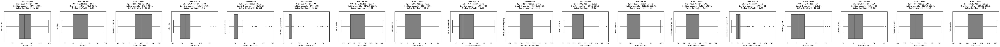

In [286]:
uva_outlier(data, num_cols)

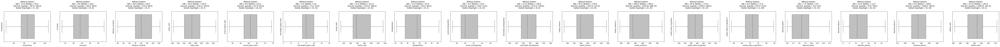

In [287]:
# Representation of data with outliers removed

uva_outlier(data, num_cols,include_outlier=False)

- We can confirm the prescence of outliers.
- They will be handled eventually.

In [288]:
# Filtering categorical columns

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
cat_cols = data.select_dtypes(exclude = numerics).columns.to_list()

In [289]:
cat_cols

['class']

In [290]:
def uva_cat(data, var_group):

  '''
  Univariate Analysis for Categorical:
  
  takes a group of variables (category) and plot all the value_counts and barplot along with descriptives.
  '''
  
  size = len(var_group)
  plt.figure(figsize = (9*size,2), dpi = 100)

  # Loop for every variable

  for j,i in enumerate(var_group):
    norm_count = data[i].value_counts(normalize = True)
    n_uni = data[i].nunique()

  #Plotting the variable with every information
    
    plt.subplot(1,size,j+1)
    sns.barplot(norm_count, norm_count.index , order = norm_count.index,palette="rocket")
    plt.xlabel('Fraction/Percent', fontsize = 15)
    plt.ylabel('{}'.format(i), fontsize = 15)
    plt.title('n_uniques = {} \n value counts \n {};'.format(n_uni,norm_count))

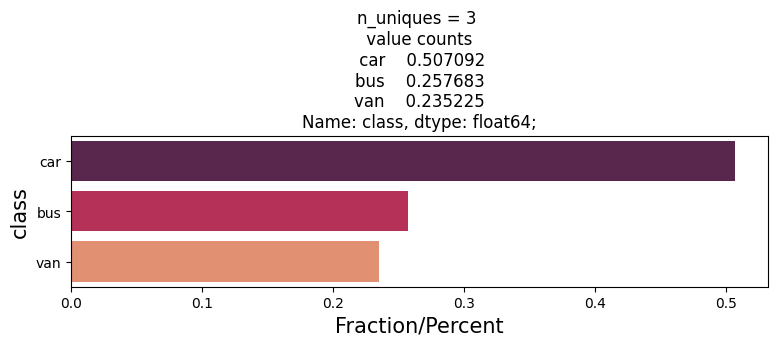

In [291]:
uva_cat(data, cat_cols)

- We can see the prescence of imbalance in the dataset.
- The number of cars is much more than bus or van.

In [292]:
# Calculating correlation

corr = data[num_cols].corr()
corr

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684887,0.789928,0.689743,0.091534,0.148249,0.812620,-0.788750,0.813694,0.676143,0.762070,0.814012,0.585243,-0.249593,0.236078,0.157015,0.298537,0.365552
circularity,0.684887,1.000000,0.792320,0.620912,0.153778,0.251467,0.847938,-0.821472,0.843400,0.961318,0.796306,0.835946,0.925816,0.051946,0.144198,-0.011439,-0.104426,0.046351
distance_circularity,0.789928,0.792320,1.000000,0.767035,0.158456,0.264686,0.905076,-0.911307,0.893025,0.774527,0.861519,0.886017,0.705771,-0.225944,0.113924,0.265547,0.146098,0.332732
radius_ratio,0.689743,0.620912,0.767035,1.000000,0.663447,0.450052,0.734429,-0.789481,0.708385,0.568949,0.793415,0.718436,0.536372,-0.180397,0.048713,0.173741,0.382214,0.471309
pr.axis_aspect_ratio,0.091534,0.153778,0.158456,0.663447,1.000000,0.648724,0.103732,-0.183035,0.079604,0.126909,0.272910,0.089189,0.121971,0.152950,-0.058371,-0.031976,0.239886,0.267725
max.length_aspect_ratio,0.148249,0.251467,0.264686,0.450052,0.648724,1.000000,0.166191,-0.180140,0.161502,0.305943,0.318957,0.143253,0.189743,0.295735,0.015599,0.043422,-0.026081,0.143919
scatter_ratio,0.812620,0.847938,0.905076,0.734429,0.103732,0.166191,1.000000,-0.971601,0.989751,0.809083,0.948662,0.993012,0.799875,-0.027542,0.074458,0.212428,0.005628,0.118817
elongatedness,-0.788750,-0.821472,-0.911307,-0.789481,-0.183035,-0.180140,-0.971601,1.000000,-0.948996,-0.775854,-0.936382,-0.953816,-0.766314,0.103302,-0.052600,-0.185053,-0.115126,-0.216905
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.708385,0.079604,0.161502,0.989751,-0.948996,1.000000,0.810934,0.934227,0.988213,0.796690,-0.015495,0.083767,0.214700,-0.018649,0.099286
max.length_rectangularity,0.676143,0.961318,0.774527,0.568949,0.126909,0.305943,0.809083,-0.775854,0.810934,1.000000,0.744985,0.794615,0.866450,0.041622,0.135852,0.001366,-0.103948,0.076770


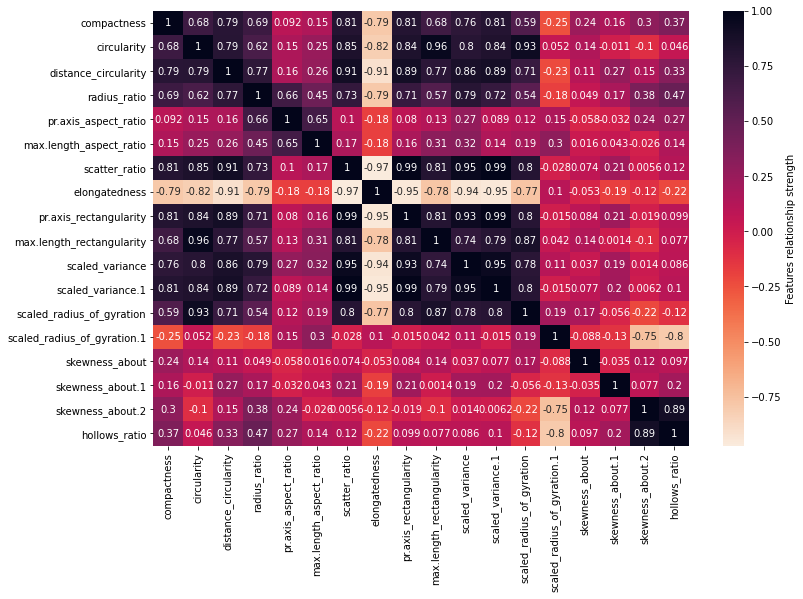

In [293]:
# Plotting the heatmap for the respective correlation

plt.figure(figsize=(12,8))

sns.heatmap(corr,annot=True,cbar_kws={'label': 'Features relationship strength'},cmap='rocket_r');

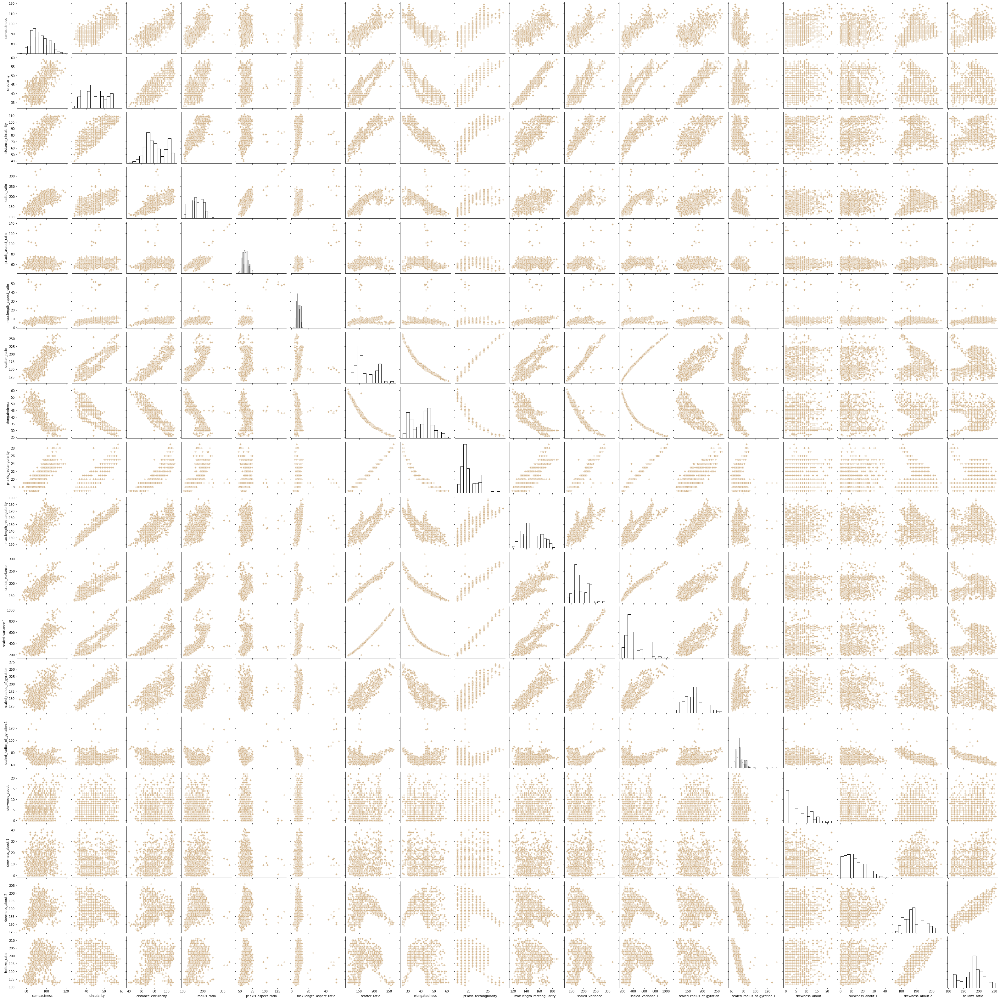

In [294]:
# Plot to check the correlation

sns.pairplot(data,diag_kind='hist',plot_kws=dict(marker="P", linewidth=0.5,color='tan'),diag_kws=dict(fill=False,color='black'));

Observation from Correlation Matrix,Pair Plots and Heatmap :
- We can see lots of strong correlation between the given variables be it positive or negative.
- Such correlations can be used in feature engineering to generate better inputs to the model. 

In [295]:
# Creating the pivot table based on 'class' column
# Using aggregate function as minimum

pd.pivot_table(data, index =['class'],aggfunc=min)

,circularity,compactness,distance_circularity,elongatedness,hollows_ratio,max.length_aspect_ratio,max.length_rectangularity,pr.axis_aspect_ratio,pr.axis_rectangularity,radius_ratio,scaled_radius_of_gyration,scaled_radius_of_gyration.1,scaled_variance,scaled_variance.1,scatter_ratio,skewness_about,skewness_about.1,skewness_about.2
class,,,,,,,,,,,,,,,,,,
bus,35.0,78,59.0,26.0,181,4,124,47.0,18.0,113.0,117.0,65.0,163.0,299.0,141.0,0.0,0.0,178.0
car,33.0,73,40.0,30.0,182,3,118,50.0,17.0,104.0,114.0,59.0,130.0,184.0,112.0,0.0,0.0,176.0
van,34.0,82,44.0,42.0,182,2,121,48.0,17.0,105.0,109.0,61.0,134.0,194.0,114.0,0.0,0.0,176.0


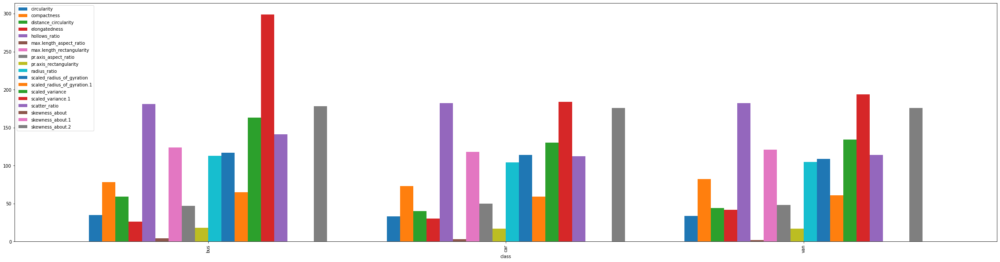

In [296]:
# Plotting the above values

pd.pivot_table(data, index =['class'],aggfunc=min).plot(kind='bar',figsize=(40,10),width =0.8);

In [297]:
# Creating the pivot table based on 'class' column
# Using aggregate function as maximum

pd.pivot_table(data, index =['class'],aggfunc=max)

,circularity,compactness,distance_circularity,elongatedness,hollows_ratio,max.length_aspect_ratio,max.length_rectangularity,pr.axis_aspect_ratio,pr.axis_rectangularity,radius_ratio,scaled_radius_of_gyration,scaled_radius_of_gyration.1,scaled_variance,scaled_variance.1,scatter_ratio,skewness_about,skewness_about.1,skewness_about.2
class,,,,,,,,,,,,,,,,,,
bus,58.0,114,109.0,47.0,209,52,175,126.0,29.0,252.0,268.0,127.0,288.0,1018.0,265.0,17.0,31.0,202.0
car,59.0,119,112.0,61.0,211,13,188,74.0,25.0,234.0,250.0,87.0,241.0,757.0,227.0,22.0,41.0,206.0
van,50.0,100,92.0,58.0,210,55,170,138.0,20.0,333.0,203.0,135.0,320.0,389.0,163.0,19.0,29.0,204.0


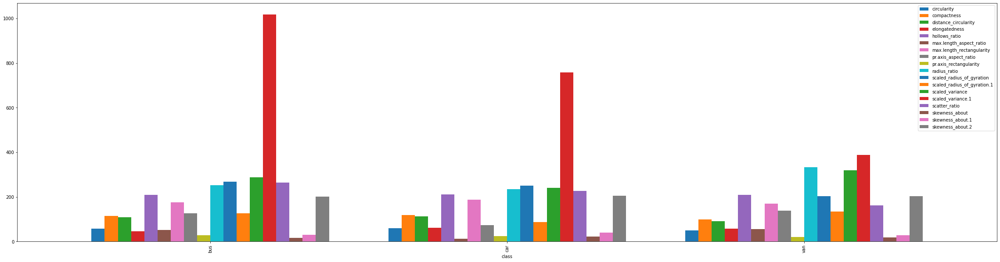

In [298]:
# Plotting the above values

pd.pivot_table(data, index =['class'],aggfunc=max).plot(kind='bar',figsize=(40,10),width =0.8);

In [299]:
# Creating the pivot table based on 'class' column
# Using aggregate function as mean(default)

pd.pivot_table(data, index =['class'])

,circularity,compactness,distance_circularity,elongatedness,hollows_ratio,max.length_aspect_ratio,max.length_rectangularity,pr.axis_aspect_ratio,pr.axis_rectangularity,radius_ratio,scaled_radius_of_gyration,scaled_radius_of_gyration.1,scaled_variance,scaled_variance.1,scatter_ratio,skewness_about,skewness_about.1,skewness_about.2
class,,,,,,,,,,,,,,,,,,
bus,44.963303,91.591743,76.811927,40.114679,191.325688,7.013761,146.701835,63.403670,20.577982,165.720183,180.963303,77.071101,192.889908,448.894495,170.022936,4.816514,10.211009,187.811927
car,46.030303,96.184149,88.878788,38.104895,197.582751,8.825175,149.967366,60.993007,21.508159,180.496503,179.613054,69.935897,197.806527,499.904429,180.997669,7.121212,15.160839,189.470862
van,42.070352,90.562814,73.281407,47.939698,196.145729,9.713568,145.175879,61.261307,18.582915,147.276382,157.276382,72.778894,164.040201,298.201005,141.537688,6.417085,9.698492,188.939698


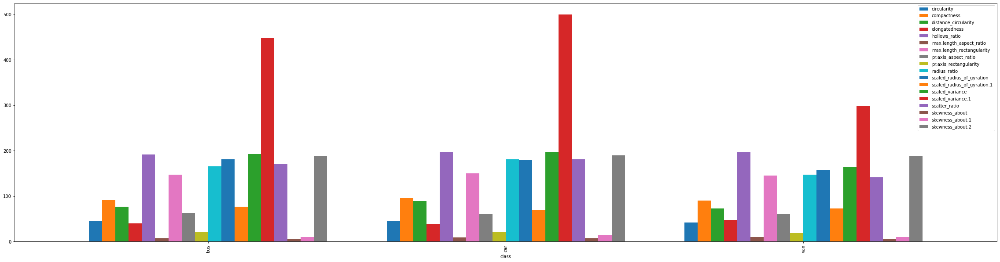

In [300]:
# Plotting the above values

pd.pivot_table(data, index =['class']).plot(kind='bar',figsize=(40,10),width =0.8);

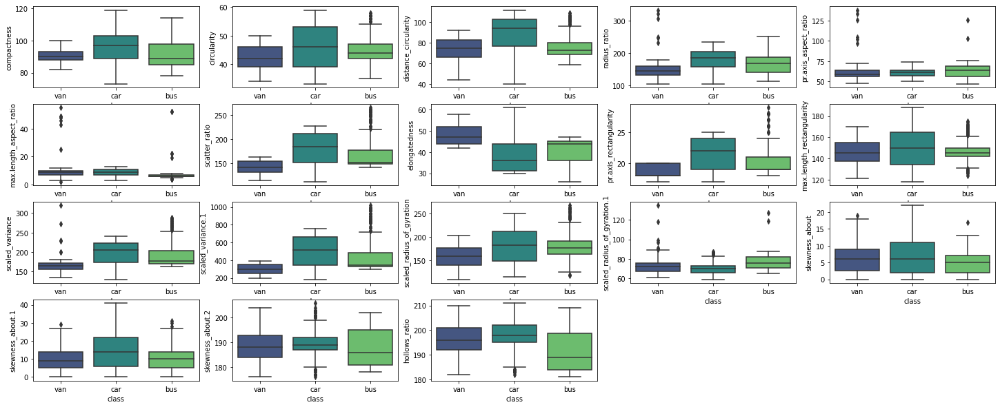

In [301]:
# Creating boxplot for each variable  based on each class of the target variable

plt.figure(figsize=(25,10))
for i, j in enumerate(data[num_cols]):
    plt.subplot(4,5,i+1)
    sns.boxplot(x='class', y=j, data=data,palette='viridis')


In [302]:
# Changing the form of the data for visualizations

data_melt = pd.melt(data, id_vars=cat_cols, value_vars=num_cols, var_name='X', value_name='Y')

In [303]:
data_melt

,class,X,Y
0,van,compactness,95.0
1,van,compactness,91.0
2,car,compactness,104.0
3,van,compactness,93.0
4,bus,compactness,85.0
...,...,...,...
15223,car,hollows_ratio,195.0
15224,van,hollows_ratio,197.0
15225,car,hollows_ratio,201.0
15226,car,hollows_ratio,195.0


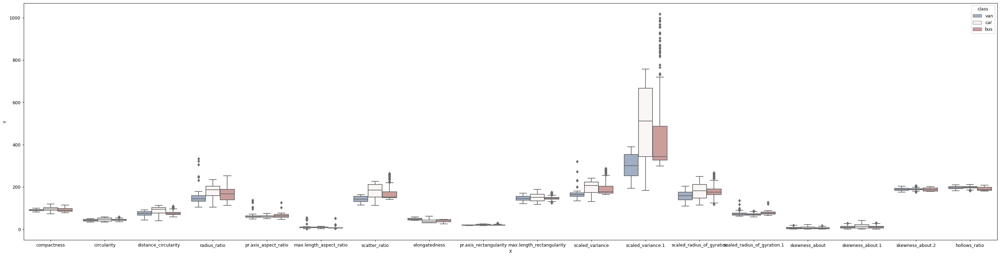

In [304]:
# Boxplot for analysing the different attributes

plt.figure(figsize=(40,10), dpi=90)
sns.boxplot( x='X',y='Y', data=data_melt,hue='class',palette='vlag')
plt.show()

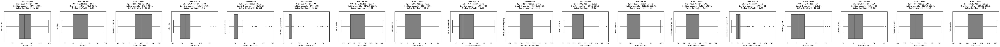

In [305]:
uva_outlier(data, num_cols)

In [306]:
# Replacing outliers with upper whisker value

for i in num_cols:
    data[i].quantile(0.25), data[i].quantile(0.75)
    IQR = data[i].quantile(0.75) - data[i].quantile(0.25)
    Q1 = data[i].quantile(0.25)
    Q3 = data[i].quantile(0.75)
    whisker_1 = Q1 - (1.5*IQR)
    whisker_2 = Q3 + (1.5*IQR)
    data[i].loc[data[i]>whisker_2] = whisker_2
    data[i].loc[data[i]<whisker_1] = whisker_1

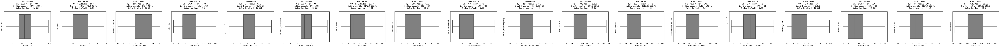

In [307]:
uva_outlier(data, num_cols)

In [308]:
# # Plot to check the correlation

# sns.pairplot(data,hue='class',markers=['o', 's', 'D'],diag_kind='hist',palette='magma');

## 3. Classifier: Design and train a best fit SVM classier using all the data attributes. 

In [309]:
# Dividing the dataset into independent variables and target variable

X = data.drop('class', axis=1)
y = data['class']

In [310]:
# Scaling

X_scaled = X.apply(zscore)

In [311]:
# Encoding target variable

y_encoded = LabelEncoder().fit_transform(y)

In [312]:
# Splitting into training and test set

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.20, random_state=101,stratify=y_encoded)

In [313]:
# Model

clf = SVC()

In [314]:
# Fitting the model and checking time to run 

clf.fit(X_train,y_train)

%time

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


<b>Please note this time</b>

In [315]:
# Predicting the response for training data

y_pred = clf.predict(X_train)

# Evaluate accuracy

print(accuracy_score(y_train, y_pred))

0.9807692307692307


In [316]:
# Predicting the response for testing data

y_pred = clf.predict(X_test)

# Evaluate accuracy

print(accuracy_score(y_test, y_pred))

0.9764705882352941


In [317]:
print('Classification Report :\n')
print(classification_report(y_test, y_pred))

Classification Report :

              precision    recall  f1-score   support

           0       0.98      0.98      0.98        44
           1       0.99      0.98      0.98        86
           2       0.95      0.97      0.96        40

    accuracy                           0.98       170
   macro avg       0.97      0.98      0.97       170
weighted avg       0.98      0.98      0.98       170



## 4. Dimensional reduction: perform dimensional reduction on the data. 

In [318]:
# Fitting the PCA on the original data to find the optimal number of principal components

pca = PCA().fit(X_train)

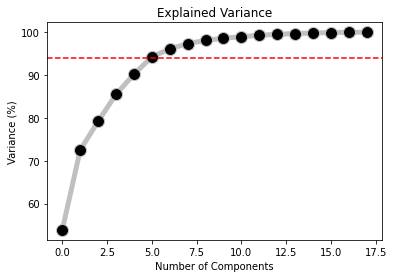

In [319]:
# Plotting the Cumulative Summation of the Explained Variance

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_) * 100,marker = 'o',color = 'silver',markerfacecolor='black', markersize=12,linewidth=5)
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Explained Variance')

# We want to preserve 94% of the variance so plot a horizontal line at 94% variance

plt.axhline(y=94, color='r', linestyle='--')
plt.show()

Text(0.5, 0, 'Principal Components')

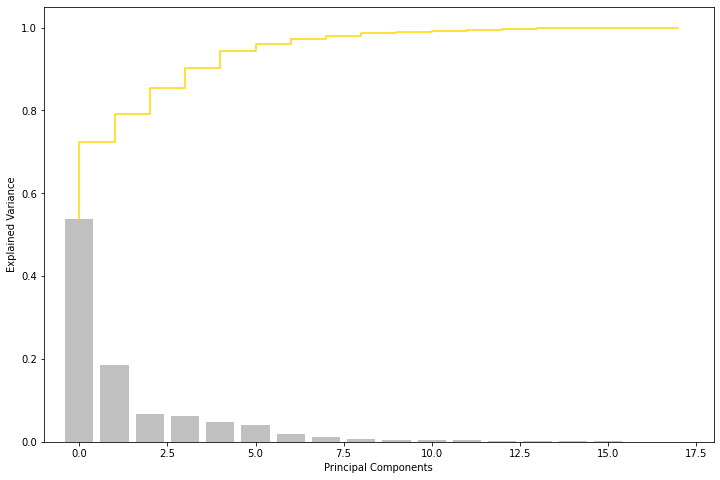

In [320]:
# Plotting the above in different form

plt.figure(figsize = (12, 8))
plt.step(range(18), np.cumsum(pca.explained_variance_ratio_),color='gold')
plt.bar(range(18), pca.explained_variance_ratio_,color='silver')
plt.xlim(-1, 18)
plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')

- After the 6th component, the change seems almost constant or negligible.

In [321]:
# Transforming the original train and test set to 6 components

# Fitting PCA on the training data

pca = PCA(6).fit(X_train)

# Transforming both training and test data

X_train_transformed = pca.transform(X_train)
X_test_transformed = pca.transform(X_test)

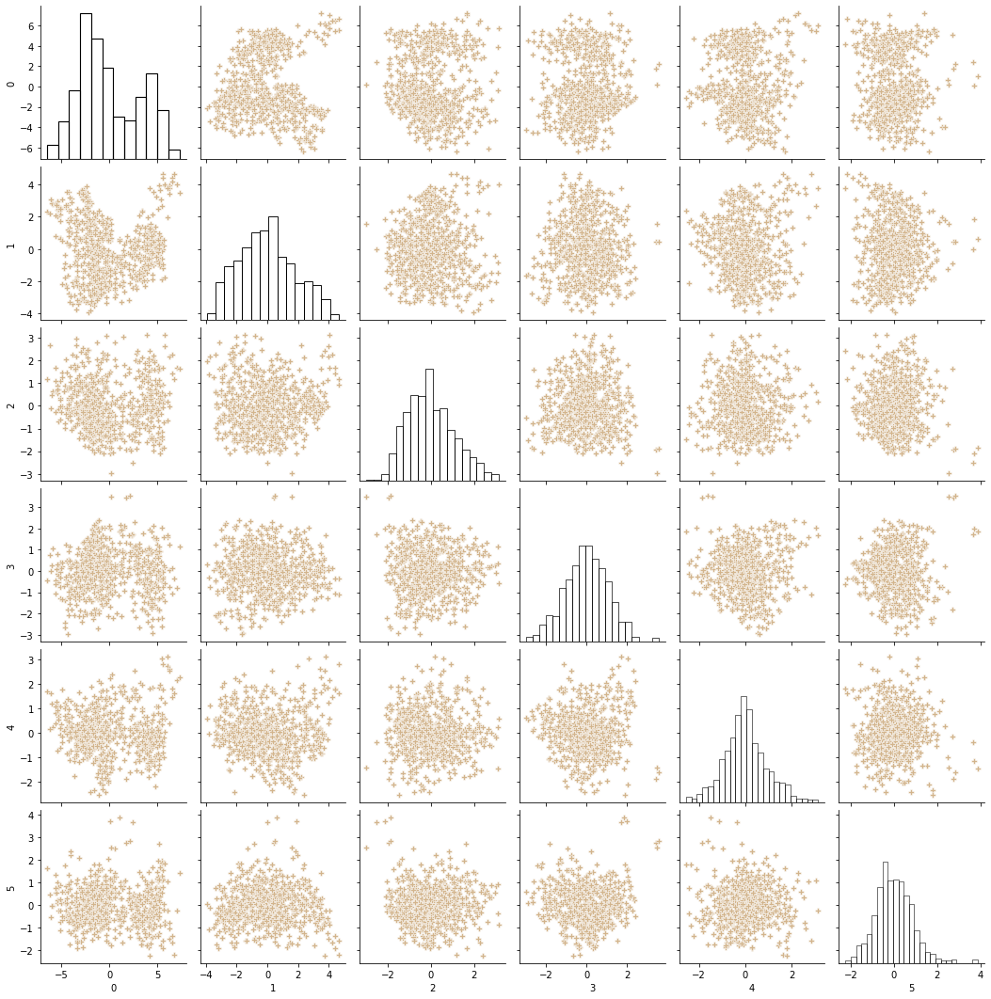

In [322]:
# Plot to check the correlation

sns.pairplot(pd.DataFrame(X_train_transformed),diag_kind='hist',plot_kws=dict(marker="P", linewidth=0.5,color='tan'),diag_kws=dict(fill=False,color='black'));

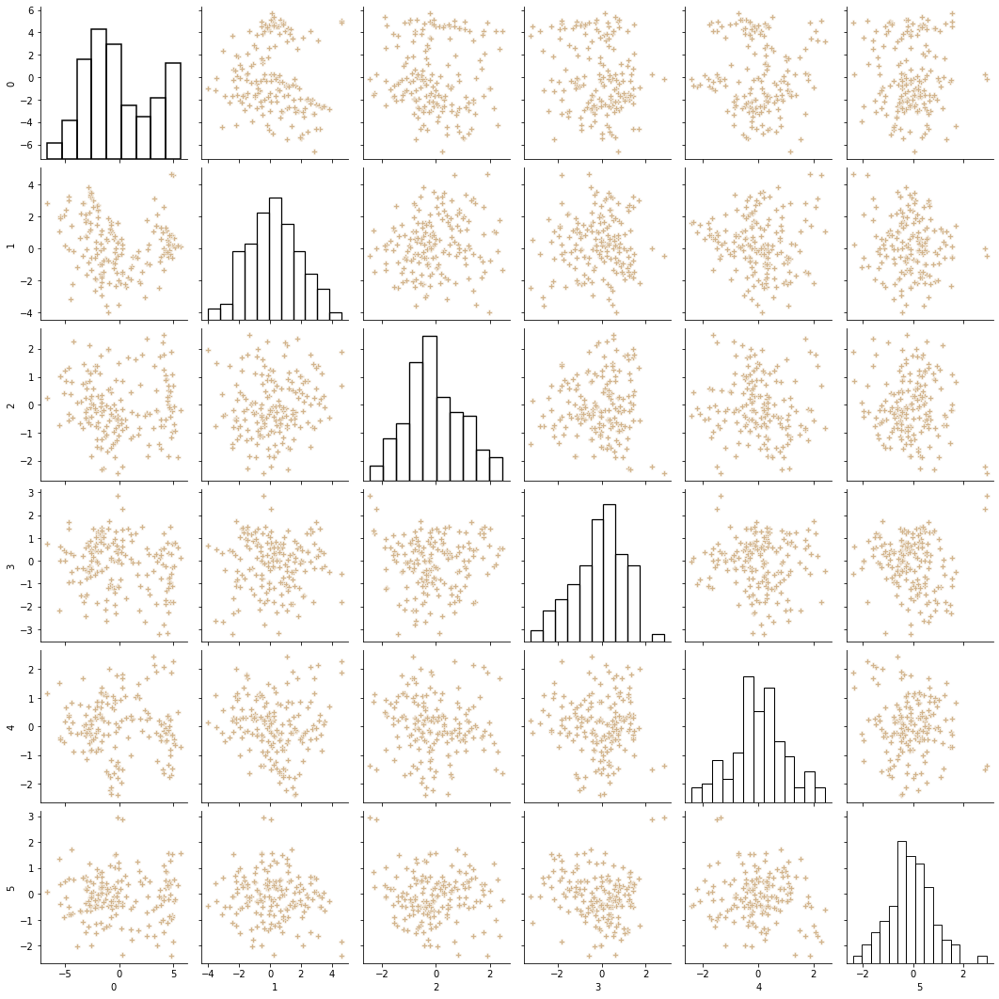

In [323]:
# Plot to check the correlation

sns.pairplot(pd.DataFrame(X_test_transformed),diag_kind='hist',plot_kws=dict(marker="P", linewidth=0.5,color='tan'),diag_kws=dict(fill=False,color='black'));

We can see that we have removed the unwanted correlation between independent variables.

In [324]:
# Checking the shape of data after PCA

X_train_transformed.shape

(676, 6)

In [325]:
# Checking the shape of data after PCA

X_test_transformed.shape

(170, 6)

## 5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes

In [326]:
# Model

clf = SVC()

In [327]:
# Fitting the model and checking time to run 

clf.fit(X_train_transformed,y_train)

%time

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.77 µs


<b>Please note this time</b>

In [328]:
# Predicting the response for training data

y_pred = clf.predict(X_train_transformed)

# Evaluate accuracy

print(accuracy_score(y_train, y_pred))

0.9304733727810651


In [329]:
# Predicting the response for testing data

y_pred = clf.predict(X_test_transformed)

# Evaluate accuracy

print(accuracy_score(y_test, y_pred))

0.9235294117647059


In [330]:
print('Classification Report :\n')
print(classification_report(y_test, y_pred))

Classification Report :

              precision    recall  f1-score   support

           0       0.95      0.91      0.93        44
           1       0.93      0.93      0.93        86
           2       0.88      0.93      0.90        40

    accuracy                           0.92       170
   macro avg       0.92      0.92      0.92       170
weighted avg       0.92      0.92      0.92       170



## 6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

Following conclusions can be made :
- We were able to reduce the number of features that needed to be fed to the model.
- We also we able to make variables orthogonal/independent of each other and thus remove multicollinearity
- Reduction in time for fitting the model was seen and can be seen from above.
- Improvement in performance was not seen but still performance after PCA is quite high with reduced number of features and also we can observe there is no overfitting involved.

# <center>USL-Project Part Four

In [331]:
# Importing the libraries

# Basic
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore


In [332]:
# Importing the datasets by reading the appropriate CSV files

Data = pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')

In [333]:
# Checking the shape of the imported datasets

print('The data set shape:',Data.shape)

The data set shape: (180, 7)


In [334]:
# Checking the information of the imported datasets

print(Data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB
None


In [335]:
# Let's first create a copy of our main dataset

data = Data.copy()

In [336]:
# Observing the dataset 'data_merged'
# First and last 5 rows displayed

data

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
175,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0
176,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0
178,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- As whole row is NaN it can be dropped

In [337]:
# Let's observe the values which might give us some more insights on automation task given.

data.describe(include='all')

,Name,Runs,Ave,SR,Fours,Sixes,HF
count,90,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
unique,90,NaN,NaN,NaN,NaN,NaN,NaN
top,R Ashwin,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,NaN,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,NaN,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,NaN,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,NaN,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,NaN,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000


In [338]:
# Lets drop the missing rows first
data.dropna(axis=0,inplace=True)

In [339]:
data.shape

(90, 7)

In [340]:
# Checking for null values

data.isna().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

In [341]:
# Identifying duplicate records in the data

dupes = data.duplicated()
sum(dupes)

0

## 1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods. 

In [342]:
# Filtering numerical columns 

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = data.select_dtypes(include=numerics).columns.to_list()

In [343]:
# Function for numeric's analysis of each column passed as a list
# Min, Max, Range, Mean, Median, Standard Deviation, Skewness, Kurtosis

def uva_num(data, data_group):
  
  ''' 
  Univariate Analysis for Numeric:
  takes a group of variables (INTEGER and FLOAT) and plots all the descriptives and properties along with KDE.\n
  
  data : dataframe from which to plot from\n
  
  data_group : {list} type Group of Continuous variables\n

  '''  

  
  size = len(data_group)
  plt.figure(figsize = (8*size,3), dpi = 100)
  
  # Looping for each variable

  for j,i in enumerate(data_group):
    
    # Calculating descriptives of variable
    
    mini = data[i].min()
    maxi = data[i].max()
    ran = data[i].max()-data[i].min()
    mean = data[i].mean()
    median = data[i].median()
    st_dev = data[i].std()
    skew = data[i].skew()
    kurt = data[i].kurtosis()
    
    # Calculating points of standard deviation
    
    points = mean-st_dev, mean+st_dev
    
    # Plotting with every information
    
    plt.subplot(1,size,j+1)
    sns.kdeplot(data[i], shade=True, color='aqua',)
    sns.lineplot(points, [0,0], color = 'yellow', label = "std_dev",linewidth = 2.5)
    sns.scatterplot([mini,maxi], [0,0], color = 'orange', label = "min/max")
    sns.scatterplot([mean], [0], color = 'red', label = "mean")
    sns.scatterplot([median], [0], color = 'blue', label = "median")
    plt.xlabel('{}'.format(i))
    plt.ylabel('density')
    plt.title('std_dev = {}; kurtosis = {};\nskew = {}; range = {}\nmean = {}; median = {}'.format((round(points[0],2),
                                                                                                    round(points[1],2)),
                                                                                                    round(kurt,2),
                                                                                                    round(skew,2),
                                                                                                    (round(mini,2),round(maxi,2),round(ran,2)),
                                                                                                    round(mean,2),
                                                                                                    round(median,2)))

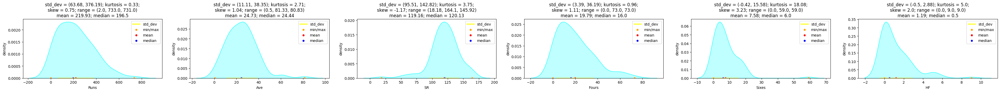

In [344]:
uva_num(data,num_cols)

- We can see from above that our data is highly skewed either positively or negatively.
- We can also see presence of outliers and it will be confirmed shortly.
- All the ditributions represents leptokurtic nature and associated kurtosis values are pretty high for few.

In [345]:
# custom function for outlier analysis

def uva_outlier(data, data_group, include_outlier = True):
  
  '''
  Univariate Analysis for Outlier:
  takes a group of variables (INTEGER and FLOAT) and plot boxplot and descriptives\n
  
  data : dataframe from which to plot from\n
  
  data_group : {list} type Group of Continuous variables\n
  
  include_outlier : {bool} whether to include outliers or not, default = True\n
  '''

  size = len(data_group)
  plt.figure(figsize = (7*size,4), dpi = 100)
  
  # Looping for each variable
  
  for j,i in enumerate(data_group):
    
    # Calculating the descriptives
    
    quant25 = data[i].quantile(0.25)
    quant75 = data[i].quantile(0.75)
    IQR = quant75 - quant25
    med = data[i].median()
    whis_low = med-(1.5*IQR)
    whis_high = med+(1.5*IQR)

    # Calculating number of outliers
    outlier_high = len(data[i][data[i]>whis_high])
    outlier_low = len(data[i][data[i]<whis_low])

    if include_outlier == True:
      
      # Plotting with every information
      
      plt.subplot(1,size,j+1)
      sns.boxplot(data[i], orient="v",palette='gray')
      plt.ylabel('{}'.format(i))
      plt.title('With Outliers\nIQR = {}; Median = {} \n 2nd,3rd  quartile = {};\n Outlier (low/high) = {} \n'.format(
                                                                                                   round(IQR,2),
                                                                                                   round(med,2),
                                                                                                   (round(quant25,2),round(quant75,2)),
                                                                                                   (outlier_low,outlier_high)
                                                                                                   ))
      
    else:
      
      # Replacing outliers with max/min whisker
      
      data2 = data[data_group][:]
      data2[i][data2[i]>whis_high] = whis_high+1
      data2[i][data2[i]<whis_low] = whis_low-1
      
      # Plotting without outliers
        
      plt.subplot(1,size,j+1)
      sns.boxplot(data2[i], orient="v",color='silver')
      plt.ylabel('{}'.format(i))
      plt.title('Without Outliers\nIQR = {}; Median = {} \n 2nd,3rd  quartile = {};\n Outlier (low/high) = {} \n'.format(
                                                                                                   round(IQR,2),
                                                                                                   round(med,2),
                                                                                                   (round(quant25,2),round(quant75,2)),
                                                                                                   (outlier_low,outlier_high)
                                                                                                   ))

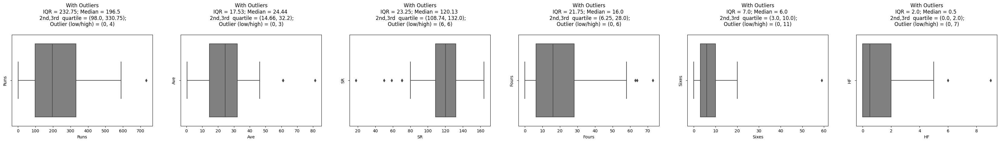

In [346]:
uva_outlier(data, num_cols)

- Outliers are present owing to prescence of extreme performers.

In [347]:
# Calculating correlation

corr = data[num_cols].corr()
corr

,Runs,Ave,SR,Fours,Sixes,HF
Runs,1.000000,0.692984,0.493489,0.918809,0.769778,0.835148
Ave,0.692984,1.000000,0.623606,0.546211,0.682414,0.620754
SR,0.493489,0.623606,1.000000,0.384810,0.583943,0.427584
Fours,0.918809,0.546211,0.384810,1.000000,0.522574,0.783689
Sixes,0.769778,0.682414,0.583943,0.522574,1.000000,0.767696
HF,0.835148,0.620754,0.427584,0.783689,0.767696,1.000000


- No negative correlation

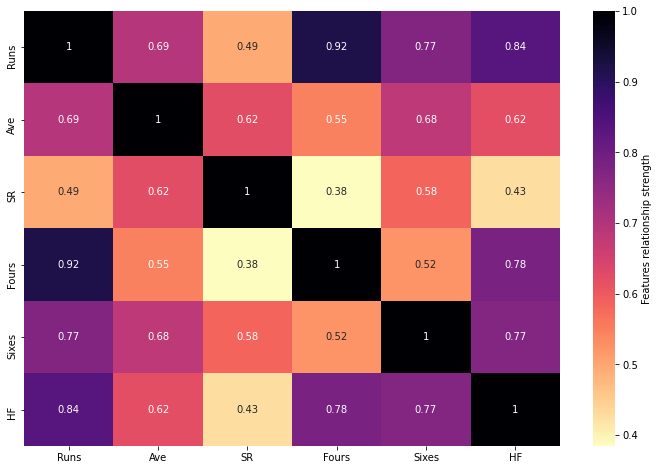

In [348]:
# Plotting the heatmap for the respective correlation

plt.figure(figsize=(12,8))

sns.heatmap(corr,annot=True,cbar_kws={'label': 'Features relationship strength'},cmap='magma_r');

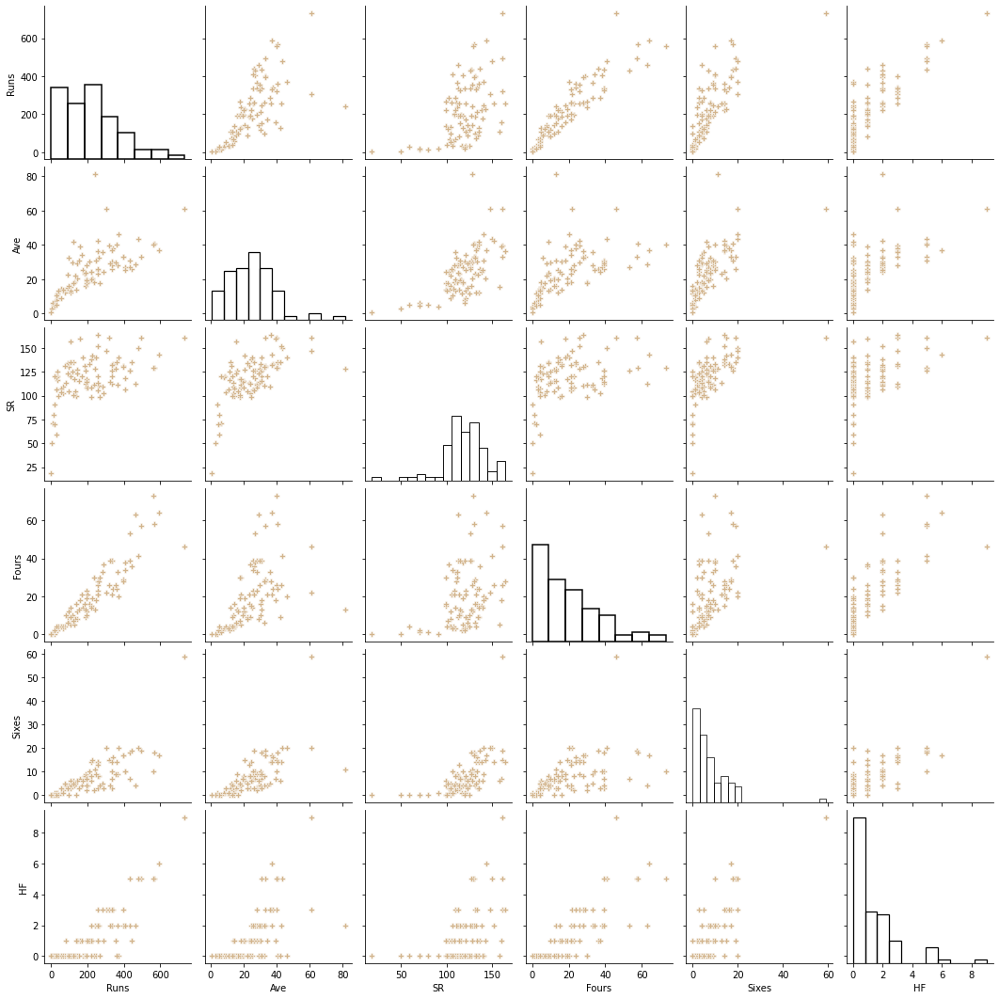

In [349]:
# Plot to check the correlation

sns.pairplot(data,diag_kind='hist',plot_kws=dict(marker="P", linewidth=0.5,color='tan'),diag_kws=dict(fill=False,color='black'));

- We can lots of positive correlation between the independent variables and thus multicollinearity.
- Thus, it's suitable to apply PCA here

In [350]:
data

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0
...,...,...,...,...,...,...,...
171,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0
173,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0
175,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0
177,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0


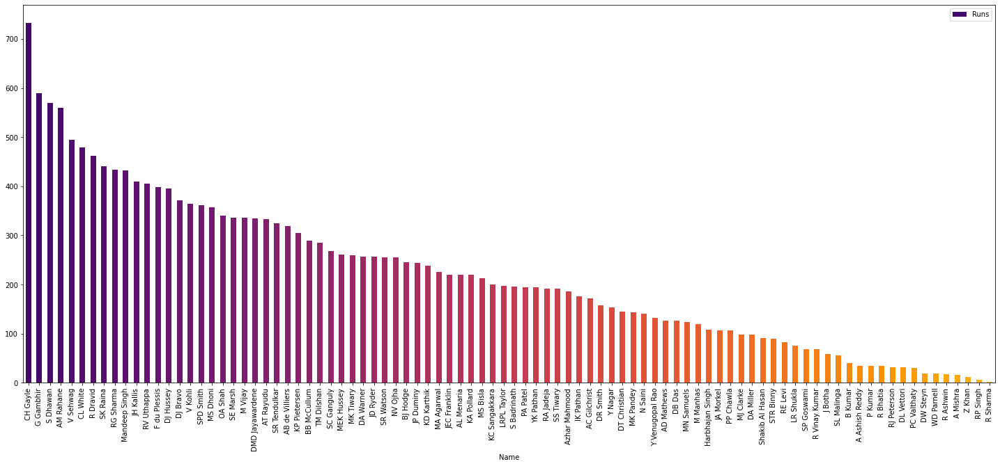

In [351]:
# Plotting name of the players with the total runs
# It depicts how experienced is the batsman

color = cm.inferno_r(np.linspace(.8, .1, 100))
data.sort_values('Runs',ascending=False).plot(x='Name', y='Runs',kind="bar",figsize=(25,10),color=color);

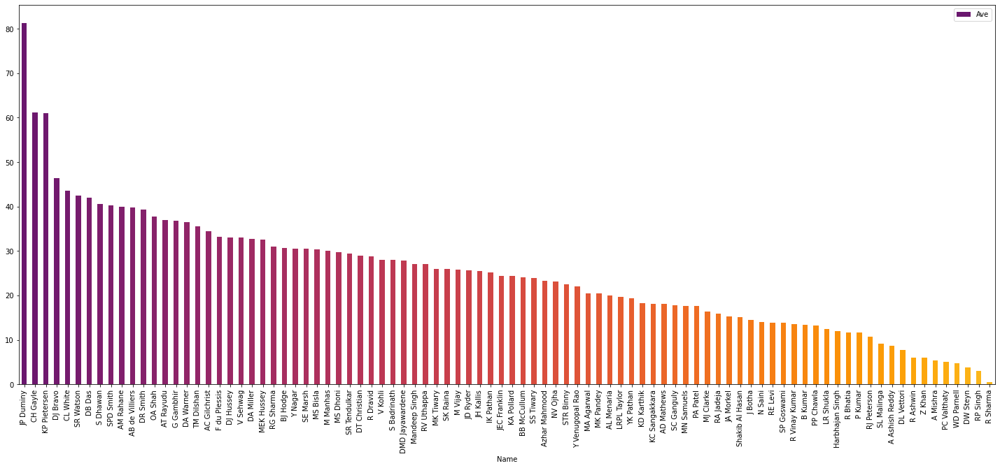

In [352]:
# Plotting name of the players with the current average
# It predicts around how much each batsman will score in given match
# It also depicts the consistency of the players

color = cm.inferno_r(np.linspace(.7, .1, 100))
data.sort_values('Ave',ascending=False).plot(x='Name', y='Ave',kind="bar",figsize=(25,10),color=color);

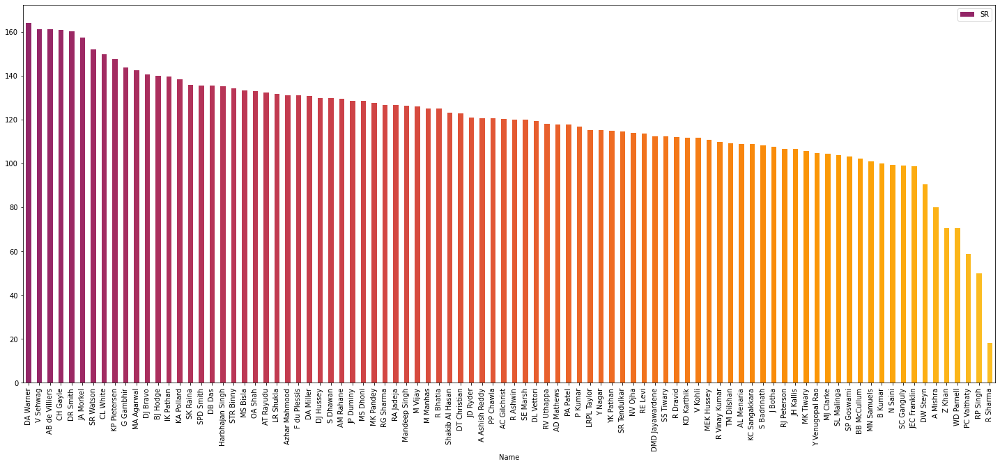

In [353]:
# Plotting name of the players with the strike rate
# It depicts how much a player can score on average in given number of balls

color = cm.inferno_r(np.linspace(.6, .1, 100))
data.sort_values('SR',ascending=False).plot(x='Name', y='SR',kind="bar",figsize=(25,10),color=color);

- As IPL is a short-time format game, we can see that most players have a high strike rate.

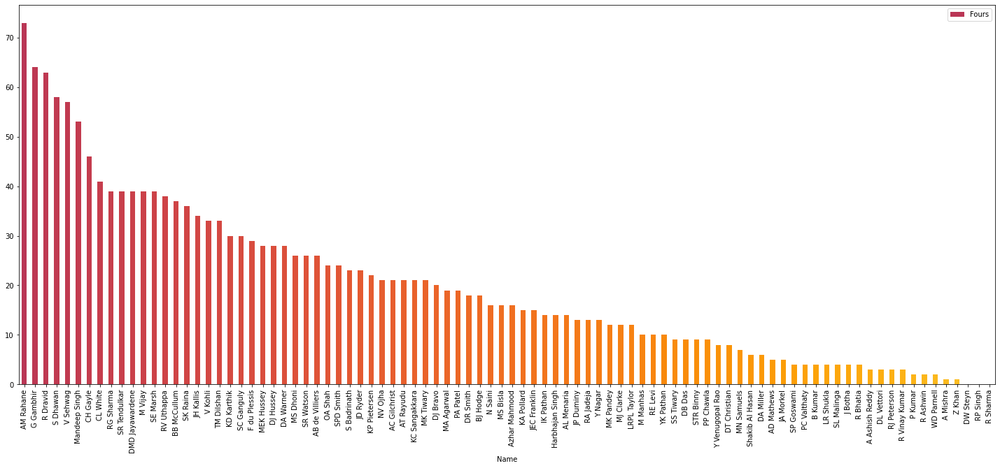

In [354]:
# Plotting name of the players with the total Fours
# It depicts the class of the bastman as hitting grounded boundary shots are difficult

color = cm.inferno_r(np.linspace(.5, .1, 100))
data.sort_values('Fours',ascending=False).plot(x='Name', y='Fours',kind="bar",figsize=(25,10),color=color);

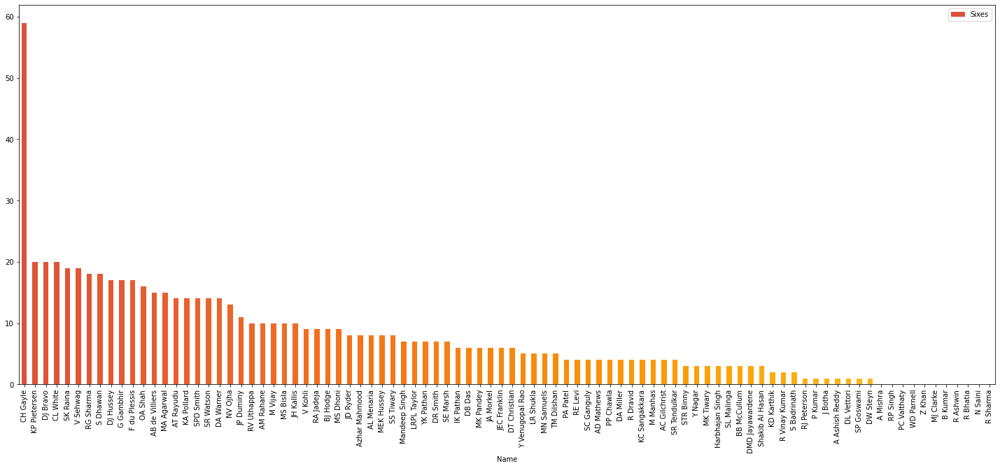

In [355]:
# Plotting name of the players with the total Sixes
# It depicts the strength of the batsman

color = cm.inferno_r(np.linspace(.4, .1, 100))
data.sort_values('Sixes',ascending=False).plot(x='Name', y='Sixes',kind="bar",figsize=(25,10),color=color);

- We can see the player CH Gayle has done outstandingly well in this category.
- It's because of players like these we have outliers in our data. 

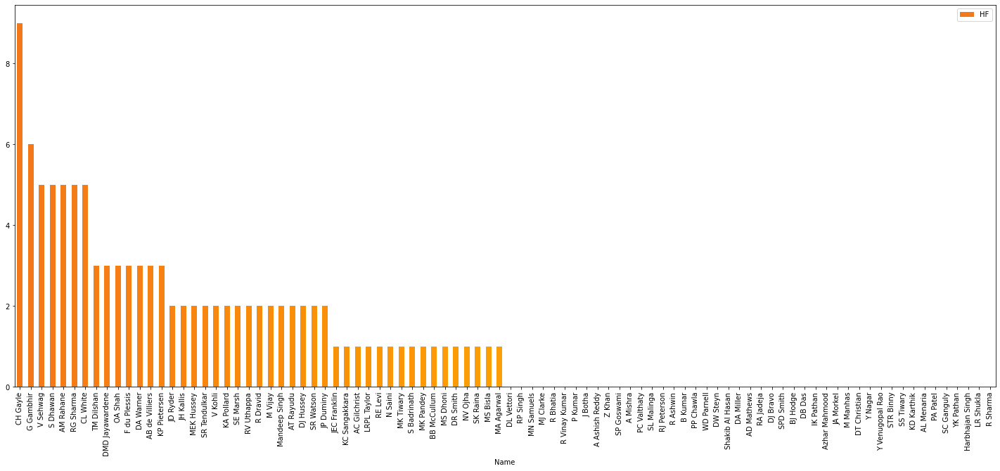

In [356]:
# Plotting name of the players with their half centuries
# It depicts the class of the bastman as hitting grounded boundary shots are difficult

color = cm.inferno_r(np.linspace(.3, .1, 100))
data.sort_values('HF',ascending=False).plot(x='Name', y='HF',kind="bar",figsize=(25,10),color=color);

- As we know the IPL is short-time format game hence, half centuries are pretty common.
- But batsman who get to bat in lower order don't get enough overs to finish their half-century and hence values are missing. 

## 2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.

In [357]:
# Filtering numerical columns 

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = data.select_dtypes(include=numerics).columns.to_list()

In [358]:
data_num = data[num_cols]

In [359]:
data_num

,Runs,Ave,SR,Fours,Sixes,HF
1,733.0,61.08,160.74,46.0,59.0,9.0
3,590.0,36.87,143.55,64.0,17.0,6.0
5,495.0,33.00,161.23,57.0,19.0,5.0
7,479.0,43.54,149.68,41.0,20.0,5.0
9,569.0,40.64,129.61,58.0,18.0,5.0
...,...,...,...,...,...,...
171,12.0,6.00,70.58,1.0,0.0,0.0
173,19.0,4.75,70.37,2.0,0.0,0.0
175,30.0,5.00,58.82,4.0,0.0,0.0
177,6.0,3.00,50.00,0.0,0.0,0.0


In [360]:
# Scaling the data using the standard scaler

num_cols = StandardScaler().fit_transform(data_num)

In [361]:
# Generating the covariance matrix

cov_matrix = np.cov(num_cols.T) # the relevanat covariance matrix
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[1.01123596 0.70077082 0.49903347 0.9291323  0.77842677 0.84453142]
 [0.70077082 1.01123596 0.63061271 0.55234856 0.69008186 0.62772842]
 [0.49903347 0.63061271 1.01123596 0.38913406 0.59050396 0.43238784]
 [0.9291323  0.55234856 0.38913406 1.01123596 0.52844526 0.79249429]
 [0.77842677 0.69008186 0.59050396 0.52844526 1.01123596 0.77632221]
 [0.84453142 0.62772842 0.43238784 0.79249429 0.77632221 1.01123596]]


In [362]:
# Generating the eigen values and the eigen vectors

e_vals, e_vecs = np.linalg.eig(cov_matrix)
print('Eigenvectors \n%s' %e_vecs)
print('\nEigenvalues \n%s' %e_vals)

Eigenvectors 
[[-0.4582608  -0.26643209 -0.70483594 -0.45840889  0.10977942  0.00520142]
 [-0.39797313  0.33111756  0.0606373   0.10122837 -0.00550486 -0.84736307]
 [-0.3253838   0.69780334 -0.05624934  0.11890348  0.45013448  0.43275029]
 [-0.40574167 -0.47355804  0.58514214 -0.09676885  0.50823538  0.03252305]
 [-0.41733459  0.17902455  0.35786211 -0.39458014 -0.66942589  0.24878157]
 [-0.43237178 -0.27593225 -0.16096217  0.77486668 -0.28082541  0.17811777]]

Eigenvalues 
[4.30252561 0.83636692 0.01706297 0.16567829 0.41665751 0.32912443]


In [363]:
# The "cumulative variance explained" analysis

tot = sum(e_vals)
var_exp = [( i /tot ) * 100 for i in sorted(e_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 70.91199612  84.696562    91.56369501  96.98815324  99.71877694
 100.        ]


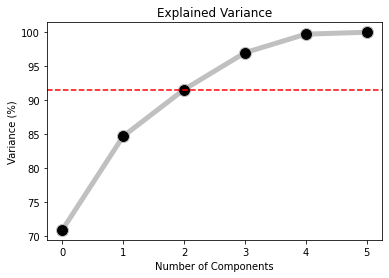

In [364]:
# Plotting the Cumulative Summation of the Explained Variance

plt.figure()
plt.plot(cum_var_exp ,marker = 'o',color = 'silver',markerfacecolor='black', markersize=12,linewidth=5)
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Explained Variance')

# We want to preserve 91% of the variance so plot a horizontal line at 91% variance

plt.axhline(y=91.56369501, color='r', linestyle='--')
plt.show()

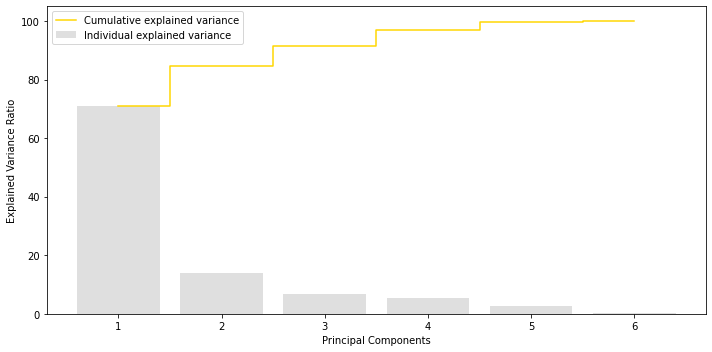

In [365]:
# Plotting the variance expalained by the principal components and the cumulative variance explained

plt.figure(figsize=(10 , 5))
plt.bar(range(1, e_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance',color='silver')
plt.step(range(1, e_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance',color='gold')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [366]:
e_vals

array([4.30252561, 0.83636692, 0.01706297, 0.16567829, 0.41665751,
       0.32912443])

In [367]:
e_vecs

array([[-0.4582608 , -0.26643209, -0.70483594, -0.45840889,  0.10977942,
         0.00520142],
       [-0.39797313,  0.33111756,  0.0606373 ,  0.10122837, -0.00550486,
        -0.84736307],
       [-0.3253838 ,  0.69780334, -0.05624934,  0.11890348,  0.45013448,
         0.43275029],
       [-0.40574167, -0.47355804,  0.58514214, -0.09676885,  0.50823538,
         0.03252305],
       [-0.41733459,  0.17902455,  0.35786211, -0.39458014, -0.66942589,
         0.24878157],
       [-0.43237178, -0.27593225, -0.16096217,  0.77486668, -0.28082541,
         0.17811777]])

In [368]:
pc1 = e_vals[0]*e_vecs[0]

In [369]:
pc2 = e_vals[1]*e_vecs[1]

In [370]:
pc3 = e_vals[4]*e_vecs[4]

In [371]:
pc = pc1 + pc2 + pc3 

In [372]:
pc

array([-2.47841597, -0.79480318, -2.83275369, -2.05205672,  0.18880335,
       -0.58267051])

In [373]:
data.reset_index(inplace=True,drop=True)

In [374]:
data['Rank']= (num_cols.dot(pc))

In [375]:
data['Rank']= data.index + 1

In [376]:
data

,Name,Runs,Ave,SR,Fours,Sixes,HF,Rank
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,1
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,2
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,3
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,4
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,5
...,...,...,...,...,...,...,...,...
85,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,86
86,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,87
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,88
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,89


> **Conclusion:**
    We can match the above dataframe with our analysis graphs and conclude that the match is quite good and ranking of players has been done appropriately.

# <center>USL-Project Part Five

## 1. List down all possible dimensionality reduction techniques that can be implemented using python. 

- Missing Value Ratio
- Low Variance Filter
- High Correlation Filter
- Random Forest
- Backward Elimination
- Forward selection
- PCA
- FA
- ICA
- LDA
- Truncated SVD
- Kernel PCA
- t-SNE
- MDS
- ISOMAP
- UMAP

## 2. So  far  you  have  used  dimensional  reduction  on  numeric  data.  Is  it  possible  to  do  the  same  on  a  multimedia  data  [images  and  video]  and text data ? Please illustrate your findings using a simple implementation on python

- Yes it's possible to do so on multimedia data.
- It is illustrated below in the following code.

In [377]:
# import required libraries

# Basic
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Download Dataset
from sklearn.datasets import fetch_openml

# Dimensionality Reduction
from sklearn.decomposition import PCA

# Model
from sklearn.ensemble import RandomForestClassifier


In [378]:
# Downloading/Importing the data

X, y = fetch_openml('mnist_784', version=1, return_X_y=True)

In [379]:
# Checking the shape of data

X.shape

(70000, 784)

In [380]:
# Checking the information on the dataset

X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Columns: 784 entries, pixel1 to pixel784
dtypes: float64(784)
memory usage: 418.7 MB


In [381]:
# Checking the data

X

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


It's an image classification dataset where the features together represents an image.

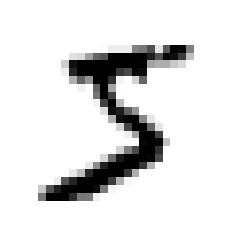

In [382]:
# Displaying the first image

digit = X.iloc[0].values
digit_image = digit.reshape(28, 28)
plt.imshow(digit_image, cmap=plt.cm.gray_r, interpolation="nearest")
plt.axis('off')
plt.show()

In [383]:
# Scaling the data

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

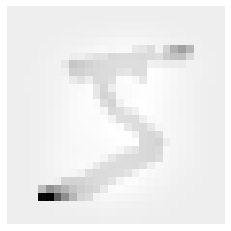

In [384]:
# Displaying the first image after scaling

digit_scaled = X_scaled[0]
digit_scaled_image = digit_scaled.reshape(28, 28)
plt.imshow(digit_scaled_image, cmap=plt.cm.gray_r, interpolation="nearest")
plt.axis('off')
plt.show()

In [385]:
# Seperating the training and test set

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, random_state = 101, test_size = 0.2)

In [386]:
# Creating the random forest classification model to classify an image
# Giving some initial parameters to avoid overfitting

model = RandomForestClassifier(random_state=101, max_depth=4)

<b>Classification without PCA</b>

In [387]:
# Fitting the model

model.fit(X_train, y_train)

RandomForestClassifier(max_depth=4, random_state=101)

In [388]:
# Predicting for the original test set

pred_1 = model.predict(X_test)

In [389]:
# Checking the accuracy score on train set

accuracy_score(model.predict(X_train), y_train)

0.8129107142857143

In [390]:
# Checking the accuracy score on test set
accuracy_score(pred_1, y_test)

0.8105714285714286

<b>Classification after PCA</b>

In [391]:
# Fitting the PCA on the original data to find the optimal number of principal components

pca = PCA().fit(X_train)

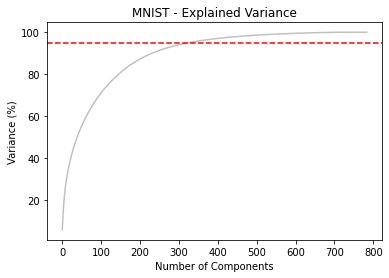

In [392]:
# Plotting the Cumulative Summation of the Explained Variance

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_) * 100, color='silver')
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('MNIST - Explained Variance')

# We want to preserve 95% of the variance so plot a horizontal line at 95% variance

plt.axhline(y=95, color='r', linestyle='--')
plt.show()

In [393]:
# Transforming the original train and test set to 350 components

# Fitting PCA on the training data

pca = PCA(350).fit(X_train)

# Transforming both training and test data
X_train_transformed = pca.transform(X_train)
X_test_transformed = pca.transform(X_test)

In [394]:
# Checking shape of data after PCA

X_train_transformed.shape

(56000, 350)

In [395]:
# Checking shape of data after PCA

X_test_transformed.shape

(14000, 350)

In [396]:
# Fitting the same random forest model on transformed data

model.fit(X_train_transformed,y_train)

RandomForestClassifier(max_depth=4, random_state=101)

In [397]:
# Predicting for the transformed validation set

pred_2 = model.predict(X_test_transformed)

In [398]:
# Checking the accuracy score on train set

accuracy_score(model.predict(X_train_transformed), y_train)

0.82625

In [399]:
# Checking the accuracy score on test set

accuracy_score(pred_2, y_test)

0.8189285714285715

Conclusion:
- We used a dimensionality reduction technique (PCA) on an image data set.
- After doing PCA on the dataset and giving the reduced features to same algorithm used without PCA we got a model with reduced number of features and better performance on accuracy score.